
# Pneumonia Prediction Using Chest X-Ray Images

**Student Number:** 100675783 
**Course:** Data Mining and Foundation of AI (6CC555)

## Introduction

Pneumonia is an inflammatory condition of the lung primarily affecting the small air sacs known as alveoli. It can be life-threatening, especially for young children and the elderly. Early and accurate diagnosis is crucial for effective treatment. Chest X-rays are the primary diagnostic tool used by radiologists to identify pneumonia.

This project aims to develop deep learning models to automatically detect pneumonia from chest X-ray images. We will implement and compare three different architectures:
1. Multilayer Perceptron (MLP)
2. Convolutional Neural Network (CNN)
3. Residual Neural Network (ResNet)

Additionally, we will implement Explainable AI (XAI) techniques to provide insights into the model's predictions, making the results more interpretable for medical professionals.



## Dataset Overview

We are using the Chest X-Ray Images (Pneumonia) dataset from Kaggle. This dataset contains chest X-ray images from pediatric patients aged one to five years old from Guangzhou Women and Children's Medical Center.

### Dataset Details:
- **Source:** [Chest X-Ray Images (Pneumonia) on Kaggle](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia)
- **Total Images:** 5,863 X-ray images (JPEG)
- **Categories:** Normal and Pneumonia
- **Split:** Train, Test, and Validation sets



Note: The validation set is quite small, so we'll create our own validation set from the training data.


## Import Libraries

In [3]:

# General libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from PIL import Image
import cv2
import random
import time

# Machine learning libraries
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, BatchNormalization, GlobalAveragePooling2D, Input
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Evaluation metrics
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve, f1_score

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

# Check if GPU is available
print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

# Display plots inline
%matplotlib inline
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (12, 8)


TensorFlow version: 2.19.0
GPU Available: []


## Set Up Data Paths

In [4]:

# Define the data paths - modify these according to your setup
BASE_DIR = 'chest_xray'  # Change this to your dataset path
TRAIN_DIR = os.path.join(BASE_DIR, 'train')
TEST_DIR = os.path.join(BASE_DIR, 'test')
VAL_DIR = os.path.join(BASE_DIR, 'val')

# Check if the directories exist
print(f"Train directory exists: {os.path.exists(TRAIN_DIR)}")
print(f"Test directory exists: {os.path.exists(TEST_DIR)}")
print(f"Validation directory exists: {os.path.exists(VAL_DIR)}")

# Define image dimensions
IMG_WIDTH, IMG_HEIGHT = 224, 224
BATCH_SIZE = 32


Train directory exists: True
Test directory exists: True
Validation directory exists: True


## Data Exploration

Dataset Distribution:
            Normal  Pneumonia  Total
Train         1341       3875   5216
Test           234        390    624
Validation       8          8     16
Total         1583       4273   5856


<Figure size 1200x600 with 0 Axes>

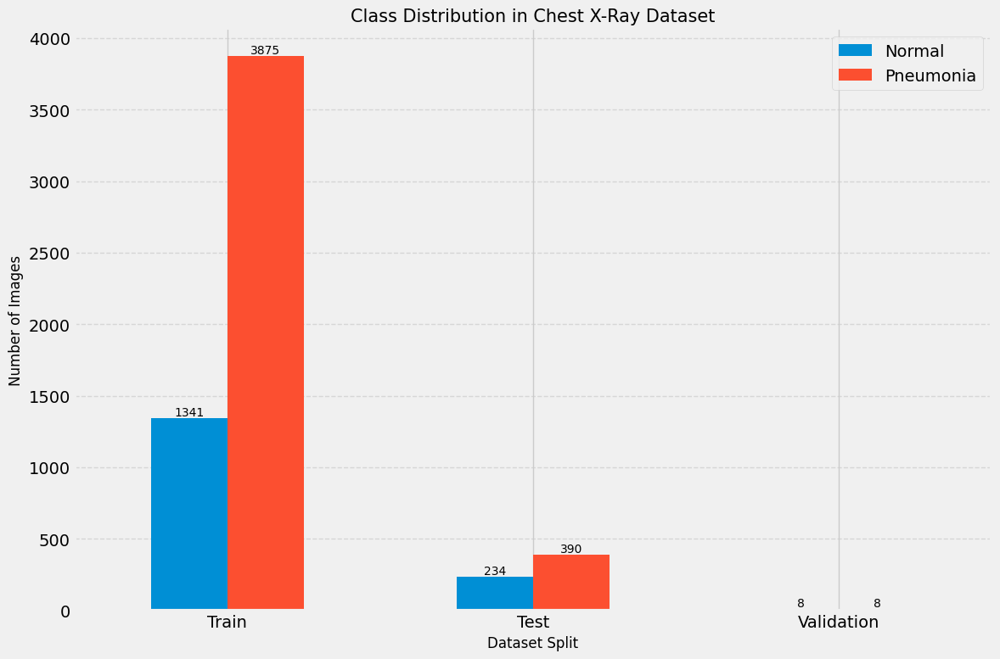

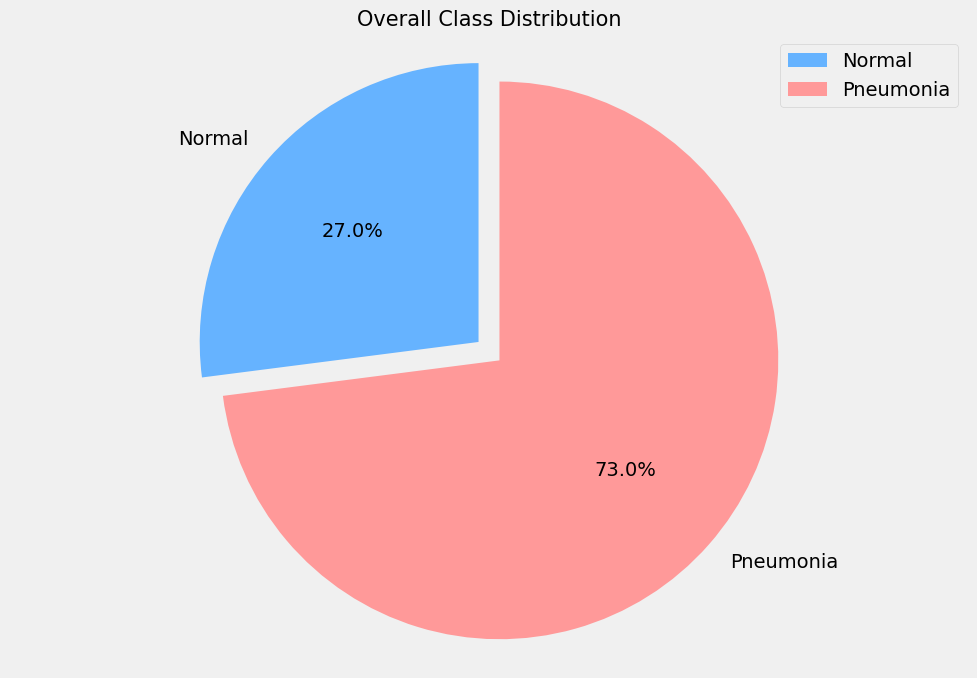

In [5]:

def count_images(directory):
    """Count the number of images in each category."""
    normal_dir = os.path.join(directory, 'NORMAL')
    pneumonia_dir = os.path.join(directory, 'PNEUMONIA')

    normal_count = len(os.listdir(normal_dir)) if os.path.exists(normal_dir) else 0
    pneumonia_count = len(os.listdir(pneumonia_dir)) if os.path.exists(pneumonia_dir) else 0

    return normal_count, pneumonia_count

# Count images in each directory
train_normal, train_pneumonia = count_images(TRAIN_DIR)
test_normal, test_pneumonia = count_images(TEST_DIR)
val_normal, val_pneumonia = count_images(VAL_DIR)

# Create a DataFrame to display the counts
data = {
    'Normal': [train_normal, test_normal, val_normal, train_normal + test_normal + val_normal],
    'Pneumonia': [train_pneumonia, test_pneumonia, val_pneumonia, train_pneumonia + test_pneumonia + val_pneumonia],
    'Total': [train_normal + train_pneumonia, test_normal + test_pneumonia, val_normal + val_pneumonia, 
             train_normal + train_pneumonia + test_normal + test_pneumonia + val_normal + val_pneumonia]
}

df = pd.DataFrame(data, index=['Train', 'Test', 'Validation', 'Total'])
print("Dataset Distribution:")
print(df)

# Visualize class distribution
plt.figure(figsize=(12, 6))
ax = df.loc[['Train', 'Test', 'Validation']][['Normal', 'Pneumonia']].plot(kind='bar')
plt.title('Class Distribution in Chest X-Ray Dataset', fontsize=15)
plt.ylabel('Number of Images', fontsize=12)
plt.xlabel('Dataset Split', fontsize=12)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add data labels on top of bars
for container in ax.containers:
    ax.bar_label(container, fontsize=10)

plt.tight_layout()
plt.show()

# Create a pie chart to show the overall class imbalance
plt.figure(figsize=(10, 7))
total_normal = df.loc['Total']['Normal']
total_pneumonia = df.loc['Total']['Pneumonia']
plt.pie([total_normal, total_pneumonia], 
        labels=['Normal', 'Pneumonia'],
        autopct='%1.1f%%',
        startangle=90,
        colors=['#66b3ff', '#ff9999'],
        explode=(0.1, 0))
plt.axis('equal')
plt.title('Overall Class Distribution', fontsize=15)
plt.legend()
plt.tight_layout()
plt.show()


### Data Exploration

Data exploration was conducted to understand the distribution of images in the dataset, including the count of images in each category (Normal and Pneumonia) and dataset split (Train, Test, and Validation).
#### Key Findings:
- **Training Set**: 
  - **Normal**: 1341 images
  - **Pneumonia**: 3875 images
  - **Total**: 5216 images

- **Testing Set**:
  - **Normal**: 234 images
  - **Pneumonia**: 390 images
  - **Total**: 624 images

- **Validation Set**:
  - **Normal**: 8 images
  - **Pneumonia**: 8 images
  - **Total**: 16 images

#### Class Distribution:
- The dataset is imbalanced, with a higher number of Pneumonia images compared to Normal images.
  - **Normal** images make up 27.0%* of the total dataset.
  - **Pneumonia** images account for 73.0% of the total dataset.

#### Observations:
- The **Training Set** contains a significantly higher number of Pneumonia images compared to Normal images.
- The **Validation Set** is quite small, so the process will follow by creating a custom validation set from the training data.

#### Conclusion:
Given the class imbalance in the dataset, several steps should be taken during model training, such as applying class weights or data augmentation, to prevent the model from being biased towards the Pneumonia class.


### Display Sample Images

Sample Images from Training Set:


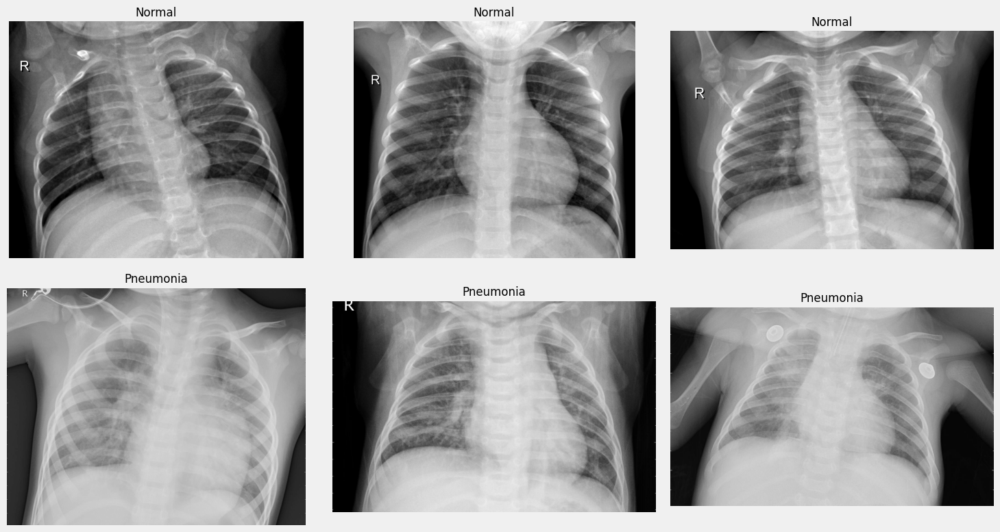

In [6]:

def display_sample_images(directory, num_samples=3):
    """Display sample images from each category."""
    normal_dir = os.path.join(directory, 'NORMAL')
    pneumonia_dir = os.path.join(directory, 'PNEUMONIA')

    # Get random samples
    if os.path.exists(normal_dir) and os.path.exists(pneumonia_dir):
        normal_samples = random.sample(os.listdir(normal_dir), min(num_samples, len(os.listdir(normal_dir))))
        pneumonia_samples = random.sample(os.listdir(pneumonia_dir), min(num_samples, len(os.listdir(pneumonia_dir))))

        plt.figure(figsize=(15, 8))

        # Display normal samples
        for i, sample in enumerate(normal_samples):
            plt.subplot(2, num_samples, i + 1)
            img = Image.open(os.path.join(normal_dir, sample))
            plt.imshow(img, cmap='gray')
            plt.title(f'Normal', fontsize=12)
            plt.axis('off')

            # Get image dimensions
            width, height = img.size
            plt.xlabel(f'Size: {width} x {height}')

        # Display pneumonia samples
        for i, sample in enumerate(pneumonia_samples):
            plt.subplot(2, num_samples, num_samples + i + 1)
            img = Image.open(os.path.join(pneumonia_dir, sample))
            plt.imshow(img, cmap='gray')
            plt.title(f'Pneumonia', fontsize=12)
            plt.axis('off')

            # Get image dimensions
            width, height = img.size
            plt.xlabel(f'Size: {width} x {height}')

        plt.tight_layout()
        plt.show()
    else:
        print("Directory doesn't exist or doesn't contain required subdirectories")

# Display sample images from training set
print("Sample Images from Training Set:")
display_sample_images(TRAIN_DIR)


### Image Size Analysis

Analyzing image sizes from training set...


Processing Pneumonia Images: 100%|██████████████████████████████████████████████████| 100/100 [00:00<00:00, 759.35it/s]


Width Statistics:
           count     mean         std    min      25%     50%     75%     max
category                                                                     
Normal     100.0  1630.19  284.596354  992.0  1453.00  1596.0  1820.5  2450.0
Pneumonia  100.0  1204.54  269.536543  457.0   984.75  1184.0  1372.0  1848.0
Height Statistics:
           count     mean         std    min      25%     50%      75%     max
category                                                                      
Normal     100.0  1346.38  302.978206  793.0  1158.00  1311.5  1473.75  2325.0
Pneumonia  100.0   826.23  256.230478  295.0   619.75   788.0   978.00  1640.0


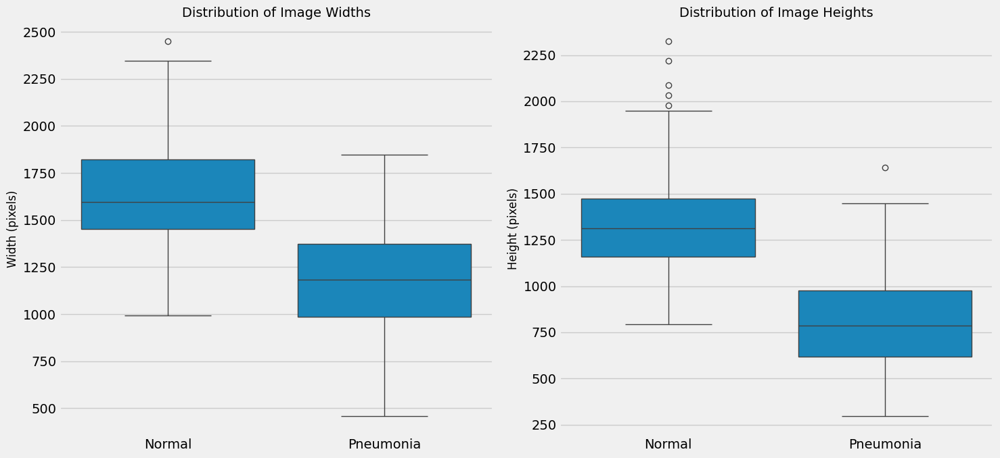

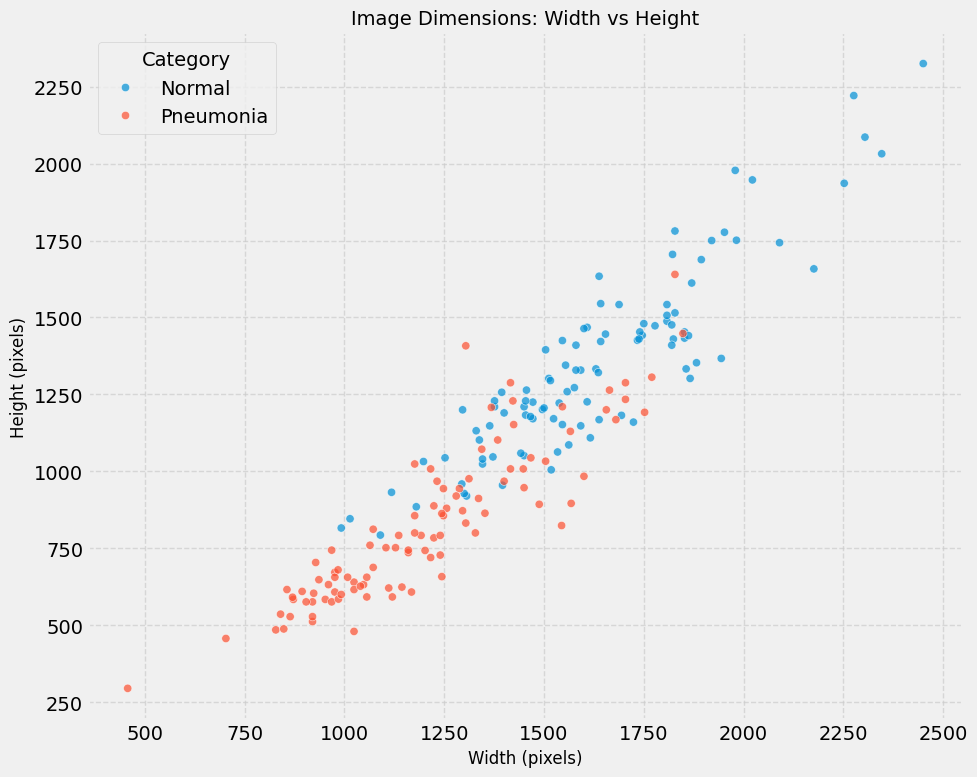

In [7]:

def analyze_image_sizes(directory, max_samples=100):
    """Analyze the sizes of images in each category."""
    normal_dir = os.path.join(directory, 'NORMAL')
    pneumonia_dir = os.path.join(directory, 'PNEUMONIA')

    sizes = {'normal': [], 'pneumonia': []}

    # Sample normal images
    if os.path.exists(normal_dir):
        normal_samples = random.sample(os.listdir(normal_dir), min(max_samples, len(os.listdir(normal_dir))))
        for sample in tqdm(normal_samples, desc="Processing Normal Images"):
            img = Image.open(os.path.join(normal_dir, sample))
            sizes['normal'].append(img.size)

    # Sample pneumonia images
    if os.path.exists(pneumonia_dir):
        pneumonia_samples = random.sample(os.listdir(pneumonia_dir), min(max_samples, len(os.listdir(pneumonia_dir))))
        for sample in tqdm(pneumonia_samples, desc="Processing Pneumonia Images"):
            img = Image.open(os.path.join(pneumonia_dir, sample))
            sizes['pneumonia'].append(img.size)

    # Create DataFrames for visualization
    normal_df = pd.DataFrame(sizes['normal'], columns=['width', 'height'])
    pneumonia_df = pd.DataFrame(sizes['pneumonia'], columns=['width', 'height'])

    # Add a category column
    normal_df['category'] = 'Normal'
    pneumonia_df['category'] = 'Pneumonia'

    # Combine DataFrames
    combined_df = pd.concat([normal_df, pneumonia_df])

    # Calculate statistics
    width_stats = combined_df.groupby('category')['width'].describe()
    height_stats = combined_df.groupby('category')['height'].describe()

    print("Width Statistics:")
    print(width_stats)
    print("Height Statistics:")
    print(height_stats)

    # Visualize size distribution
    plt.figure(figsize=(15, 7))

    plt.subplot(1, 2, 1)
    sns.boxplot(x='category', y='width', data=combined_df)
    plt.title('Distribution of Image Widths', fontsize=14)
    plt.ylabel('Width (pixels)', fontsize=12)
    plt.xlabel('')

    plt.subplot(1, 2, 2)
    sns.boxplot(x='category', y='height', data=combined_df)
    plt.title('Distribution of Image Heights', fontsize=14)
    plt.ylabel('Height (pixels)', fontsize=12)
    plt.xlabel('')

    plt.tight_layout()
    plt.show()

    # Scatter plot of widths vs heights
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x='width', y='height', hue='category', data=combined_df, alpha=0.7)
    plt.title('Image Dimensions: Width vs Height', fontsize=14)
    plt.xlabel('Width (pixels)', fontsize=12)
    plt.ylabel('Height (pixels)', fontsize=12)
    plt.legend(title='Category')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Analyze image sizes from the training set
print("Analyzing image sizes from training set...")
analyze_image_sizes(TRAIN_DIR)


### Image Size Analysis

Before preprocessing the data, sizes were analyzed (width and height) of the chest X-ray images in both **Normal** and **Pneumonia** categories.

#### Key Findings:
- **Normal Images**:
  - Average width: **1630.19 pixels**, Average height: **1346.38 pixels**
  - Larger width and height compared to pneumonia images.
  
- **Pneumonia Images**:
  - Average width: **1204.54 pixels**, Average height: **826.23 pixels**
  - Smaller width and height compared to normal images.

#### Observations:
- There is a significant size difference between the **Normal** and **Pneumonia** images, with **Normal** images being generally larger.
- The images' dimensions vary significantly, which may affect model training.

#### Conclusion:
To ensure consistent input dimensions for the model, all images will be resized to 224x224 pixels** during preprocessing.



## Data Preprocessing

Based on the exploratory data analysis, preprocessing will be conducted to the images to make them suitable for the models:

1. **Resize Images**: Standardize all images to 224x224 pixels (standard input size for many CNN architectures)
2. **Normalize Pixel Values**: Scale pixel values to the range [0, 1] or use model-specific preprocessing
3. **Data Augmentation**: Apply transformations to the training images to increase dataset diversity and reduce overfitting
4. **Create a Custom Validation Set**: Since the provided validation set is very small, we'll create our own from the training data

Implentation of these preprocessing steps is conducted below:


In [8]:

# Define image data generators
# For training - with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # Use 20% of training data for validation
)

# For testing - only rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# Create data generators
# Training set
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='training'
)

# Validation set (from training data)
validation_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='validation'
)

# Test set
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False
)

# Check the class indices
print("Class indices:", train_generator.class_indices)

# Calculate class weights to handle class imbalance
total_normal = train_normal
total_pneumonia = train_pneumonia
total = total_normal + total_pneumonia

weight_for_0 = (1 / total_normal) * (total / 2.0)  # For Normal class
weight_for_1 = (1 / total_pneumonia) * (total / 2.0)  # For Pneumonia class

class_weight = {0: weight_for_0, 1: weight_for_1}
print("Class weights:", class_weight)


Found 4173 images belonging to 2 classes.
Found 1043 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Class indices: {'NORMAL': 0, 'PNEUMONIA': 1}
Class weights: {0: 1.9448173005219984, 1: 0.6730322580645162}


### Visualize Augmented Images
To ensure that the data augmentation strategy produces reasonable transformations, a few augmented training images will be displayed. This helps verify that the key diagnostic features (e.g., lung structures) remain intact even after applying rotation, shifts, zoom, etc.


Found 5216 images belonging to 2 classes.
Augmented Training Images:


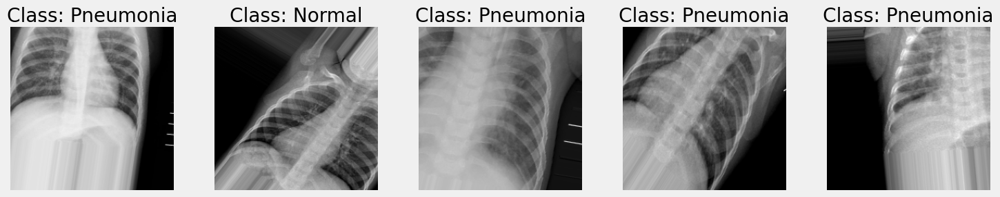

In [9]:

def show_augmented_images(generator, num_images=5):
    """Display augmented images from a generator."""
    # Get a batch of images
    batch = next(generator)
    images, labels = batch

    # Plot the images
    plt.figure(figsize=(15, 3))
    for i in range(min(num_images, len(images))):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(images[i])
        plt.title(f"Class: {'Normal' if labels[i] == 0 else 'Pneumonia'}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Create a generator with higher augmentation for visualization
vis_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)

vis_generator = vis_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=5,
    class_mode='binary',
    shuffle=True
)

# Show augmented images
print("Augmented Training Images:")
show_augmented_images(vis_generator)



## Model Development

Three different architectures will be implemented:
1. Multilayer Perceptron (MLP)
2. Convolutional Neural Network (CNN)
3. Residual Neural Network (ResNet)

Starting with the MLP model.

### 1. Multilayer Perceptron (MLP)

MLPs are considered as the simplest type of neural network, consisting of fully connected layers. Though not typically used for image classification tasks (because they don't take advantage of the spatial structure in images), the implementation will be used as a baseline.


In [10]:

def create_mlp_model():
    """Create a Multilayer Perceptron model."""
    model = Sequential([
        # Flatten the input image
        Flatten(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),

        # Hidden layers
        Dense(512, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),

        Dense(256, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),

        Dense(128, activation='relu'),
        BatchNormalization(),
        Dropout(0.5),

        # Output layer
        Dense(1, activation='sigmoid')
    ])

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=0.0001),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
    )

    return model

# Create and summarize the MLP model
mlp_model = create_mlp_model()
mlp_model.summary()


C:\Users\xagor\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ flatten (Flatten)                    │ (None, 150528)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      77,070,848 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 77,238,785 (294.64 MB)

 Trainable params: 77,236,993 (294.64 MB)

 Non-trainable params: 1,792 (7.00 KB)


### 2. Convolutional Neural Network (CNN)

Convolutional Neural Networks are specialized for processing grid-like data such as images. They use convolutional layers to automatically and adaptively learn spatial hierarchies of features.


In [11]:

def create_cnn_model():
    """Create a Convolutional Neural Network model."""
    model = Sequential([
        # Convolutional layers
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        MaxPooling2D((2, 2)),
        BatchNormalization(),

        Conv2D(64, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),

        Conv2D(128, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),

        Conv2D(256, (3, 3), activation='relu', padding='same'),
        MaxPooling2D((2, 2)),
        BatchNormalization(),

        # Flatten and dense layers
        Flatten(),
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(256, activation='relu'),
        Dropout(0.5),

        # Output layer
        Dense(1, activation='sigmoid')
    ])

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=0.0001),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
    )

    return model

# Create and summarize the CNN model
cnn_model = create_cnn_model()
cnn_model.summary()


C:\Users\xagor\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 14, 14, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 512)                 │      25,690,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,212,545 (99.99 MB)

 Trainable params: 26,211,585 (99.99 MB)

 Non-trainable params: 960 (3.75 KB)


### 3. Residual Neural Network (ResNet)

ResNet is a type of CNN that uses "skip connections" or "shortcuts" to jump over some layers. These skip connections solve the vanishing gradient problem, allowing for the training of much deeper networks.

Transfer learning will be used with the ResNet50 model pre-trained on ImageNet.


In [12]:

def create_resnet_model():
    """Create a ResNet-based model using transfer learning."""
    # Load the pre-trained ResNet50 model
    base_model = ResNet50(
        weights='imagenet',
        include_top=False,
        input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)
    )

    # Freeze the base model layers
    for layer in base_model.layers:
        layer.trainable = False

    # Add custom classification head
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(1, activation='sigmoid')(x)

    # Create the complete model
    model = Model(inputs=base_model.input, outputs=predictions)

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=0.0001),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
    )

    return model, base_model

# Create and summarize the ResNet model
resnet_model, base_model = create_resnet_model()
print("ResNet model created with frozen base layers")


ResNet model created with frozen base layers


## Model Training

train_model(model, model_name, epochs=20)
This function trains a Keras model with:

- EarlyStopping: Stops if validation loss doesn't improve for 5 epochs.

- ReduceLROnPlateau: Lowers learning rate when validation loss plateaus.

- ModelCheckpoint: Saves the best model based on lowest validation loss.

It returns:

- The training history object.

- A dictionary of key metrics (accuracy, loss, precision, recall if available).

- Total training time in seconds.

plot_training_history(history, model_name)
This function plots:

- Training & validation accuracy and loss over epochs.

- Precision and recall if available.

- Plots are saved as PNG files named after the model.

In [13]:
def train_model(model, model_name, epochs=20):
    """Train a model and save training history."""
    # Create callbacks
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        min_lr=1e-6
    )

    # Create a checkpoint to save the best model
    checkpoint = ModelCheckpoint(
        f'{model_name}_best_model.h5',
        monitor='val_loss',
        save_best_only=True,
        mode='min',
        verbose=1
    )

    # Train the model
    print(f"Training {model_name} model...")
    start_time = time.time()

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=validation_generator,
        callbacks=[early_stopping, reduce_lr, checkpoint],
        class_weight=class_weight
    )

    end_time = time.time()
    training_time = end_time - start_time
    print(f"{model_name} training completed in {training_time:.2f} seconds")

    # Find the metric names in the history
    print(f"Available metrics: {list(history.history.keys())}")

    # Find precision and recall keys
    precision_key = None
    val_precision_key = None
    recall_key = None
    val_recall_key = None

    for key in history.history.keys():
        if 'precision' in key.lower() and 'val' not in key.lower():
            precision_key = key
        elif 'precision' in key.lower() and 'val' in key.lower():
            val_precision_key = key
        elif 'recall' in key.lower() and 'val' not in key.lower():
            recall_key = key
        elif 'recall' in key.lower() and 'val' in key.lower():
            val_recall_key = key

    # Save the training history with basic metrics
    history_dict = {
        'accuracy': [float(x) for x in history.history['accuracy']],
        'val_accuracy': [float(x) for x in history.history['val_accuracy']],
        'loss': [float(x) for x in history.history['loss']],
        'val_loss': [float(x) for x in history.history['val_loss']]
    }

    # Add precision and recall if available
    if precision_key:
        history_dict['precision'] = [float(x) for x in history.history[precision_key]]
    if val_precision_key:
        history_dict['val_precision'] = [float(x) for x in history.history[val_precision_key]]
    if recall_key:
        history_dict['recall'] = [float(x) for x in history.history[recall_key]]
    if val_recall_key:
        history_dict['val_recall'] = [float(x) for x in history.history[val_recall_key]]

    return history, history_dict, training_time





def plot_training_history(history, model_name):
    """Plot the training and validation metrics."""
    # Plot training & validation accuracy
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title(f'{model_name} - Accuracy', fontsize=14)
    plt.ylabel('Accuracy', fontsize=12)
    plt.xlabel('Epoch', fontsize=12)
    plt.legend(['Train', 'Validation'], loc='lower right')
    plt.grid(True, linestyle='--', alpha=0.7)

    # Plot training & validation loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title(f'{model_name} - Loss', fontsize=14)
    plt.ylabel('Loss', fontsize=12)
    plt.xlabel('Epoch', fontsize=12)
    plt.legend(['Train', 'Validation'], loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.savefig(f'{model_name}_training_history.png')
    plt.show()

    # Find precision and recall keys
    precision_key = None
    val_precision_key = None
    recall_key = None
    val_recall_key = None

    for key in history.history.keys():
        if 'precision' in key.lower() and 'val' not in key.lower():
            precision_key = key
        elif 'precision' in key.lower() and 'val' in key.lower():
            val_precision_key = key
        elif 'recall' in key.lower() and 'val' not in key.lower():
            recall_key = key
        elif 'recall' in key.lower() and 'val' in key.lower():
            val_recall_key = key

    # Only plot precision and recall if they exist
    if precision_key and val_precision_key and recall_key and val_recall_key:
        plt.figure(figsize=(16, 6))

        plt.subplot(1, 2, 1)
        plt.plot(history.history[precision_key])
        plt.plot(history.history[val_precision_key])
        plt.title(f'{model_name} - Precision', fontsize=14)
        plt.ylabel('Precision', fontsize=12)
        plt.xlabel('Epoch', fontsize=12)
        plt.legend(['Train', 'Validation'], loc='lower right')
        plt.grid(True, linestyle='--', alpha=0.7)

        plt.subplot(1, 2, 2)
        plt.plot(history.history[recall_key])
        plt.plot(history.history[val_recall_key])
        plt.title(f'{model_name} - Recall', fontsize=14)
        plt.ylabel('Recall', fontsize=12)
        plt.xlabel('Epoch', fontsize=12)
        plt.legend(['Train', 'Validation'], loc='lower right')
        plt.grid(True, linestyle='--', alpha=0.7)

        plt.tight_layout()
        plt.savefig(f'{model_name}_precision_recall_history.png')
        plt.show()
    else:
        print(f"Precision or recall metrics not available for {model_name}")




    

### Train MLP Model

Training mlp model...
Epoch 1/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 528ms/step - accuracy: 0.5344 - loss: 1.0130 - precision: 0.7615 - recall: 0.5418
Epoch 1: val_loss improved from inf to 0.70017, saving model to mlp_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 88s 657ms/step - accuracy: 0.5346 - loss: 1.0126 - precision: 0.7617 - recall: 0.5419 - val_accuracy: 0.7440 - val_loss: 0.7002 - val_precision: 0.7505 - val_recall: 0.9819 - learning_rate: 1.0000e-04
Epoch 2/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step - accuracy: 0.5786 - loss: 0.8707 - precision: 0.8170 - recall: 0.5639
Epoch 2: val_loss improved from 0.70017 to 0.52021, saving model to mlp_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 75s 572ms/step - accuracy: 0.5786 - loss: 0.8706 - precision: 0.8169 - recall: 0.5639 - val_accuracy: 0.7546 - val_loss: 0.5202 - val_precision: 0.8138 - val_recall: 0.8684 - learning_rate: 1.0000e-04
Epoch 3/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step - accuracy: 0.5896 - loss: 0.8332 - precision: 0.8062 - recall: 0.5801
Epoch 3: val_loss improved from 0.52021 to 0.48805, saving model to mlp_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 73s 559ms/step - accuracy: 0.5896 - loss: 0.8332 - precision: 0.8063 - recall: 0.5801 - val_accuracy: 0.7795 - val_loss: 0.4881 - val_precision: 0.7783 - val_recall: 0.9832 - learning_rate: 1.0000e-04
Epoch 4/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.6196 - loss: 0.7766 - precision: 0.8432 - recall: 0.6014
Epoch 4: val_loss improved from 0.48805 to 0.44441, saving model to mlp_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 73s 559ms/step - accuracy: 0.6196 - loss: 0.7766 - precision: 0.8432 - recall: 0.6015 - val_accuracy: 0.7948 - val_loss: 0.4444 - val_precision: 0.8134 - val_recall: 0.9394 - learning_rate: 1.0000e-04
Epoch 5/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - accuracy: 0.6253 - loss: 0.7898 - precision: 0.8402 - recall: 0.6108
Epoch 5: val_loss improved from 0.44441 to 0.42689, saving model to mlp_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 73s 556ms/step - accuracy: 0.6253 - loss: 0.7897 - precision: 0.8402 - recall: 0.6108 - val_accuracy: 0.8121 - val_loss: 0.4269 - val_precision: 0.8561 - val_recall: 0.8981 - learning_rate: 1.0000e-04
Epoch 6/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step - accuracy: 0.6360 - loss: 0.7789 - precision: 0.8326 - recall: 0.6269
Epoch 6: val_loss did not improve from 0.42689
131/131 ━━━━━━━━━━━━━━━━━━━━ 72s 545ms/step - accuracy: 0.6360 - loss: 0.7785 - precision: 0.8328 - recall: 0.6269 - val_accuracy: 0.7766 - val_loss: 0.4792 - val_precision: 0.8633 - val_recall: 0.8310 - learning_rate: 1.0000e-04
Epoch 7/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.6403 - loss: 0.7258 - precision: 0.8557 - recall: 0.6235
Epoch 7: val_loss did not improve from 0.42689
131/131 ━━━━━━━━━━━━━━━━━━━━ 71s 539ms/step - accuracy: 0.6403 - loss: 0.7258 - precision: 0.8557 - recall: 0.6236 - val_accuracy: 0.7517 - val_loss: 0.5154 - val_precision: 0.8828 - val_recall: 0

131/131 ━━━━━━━━━━━━━━━━━━━━ 72s 553ms/step - accuracy: 0.6521 - loss: 0.7057 - precision: 0.8597 - recall: 0.6392 - val_accuracy: 0.8044 - val_loss: 0.4136 - val_precision: 0.8047 - val_recall: 0.9729 - learning_rate: 1.0000e-04
Epoch 9/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - accuracy: 0.6523 - loss: 0.6866 - precision: 0.8598 - recall: 0.6440
Epoch 9: val_loss did not improve from 0.41358
131/131 ━━━━━━━━━━━━━━━━━━━━ 72s 551ms/step - accuracy: 0.6525 - loss: 0.6866 - precision: 0.8598 - recall: 0.6441 - val_accuracy: 0.7843 - val_loss: 0.4743 - val_precision: 0.8599 - val_recall: 0.8477 - learning_rate: 1.0000e-04
Epoch 10/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.6617 - loss: 0.7432 - precision: 0.8485 - recall: 0.6601
Epoch 10: val_loss improved from 0.41358 to 0.39242, saving model to mlp_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 72s 553ms/step - accuracy: 0.6618 - loss: 0.7430 - precision: 0.8486 - recall: 0.6601 - val_accuracy: 0.8130 - val_loss: 0.3924 - val_precision: 0.8311 - val_recall: 0.9394 - learning_rate: 1.0000e-04
Epoch 11/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step - accuracy: 0.6640 - loss: 0.6697 - precision: 0.8651 - recall: 0.6521
Epoch 11: val_loss did not improve from 0.39242
131/131 ━━━━━━━━━━━━━━━━━━━━ 71s 539ms/step - accuracy: 0.6640 - loss: 0.6698 - precision: 0.8651 - recall: 0.6522 - val_accuracy: 0.8082 - val_loss: 0.4236 - val_precision: 0.8536 - val_recall: 0.8955 - learning_rate: 1.0000e-04
Epoch 12/15
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.6803 - loss: 0.6528 - precision: 0.8737 - recall: 0.6704
Epoch 12: val_loss did not improve from 0.39242
131/131 ━━━━━━━━━━━━━━━━━━━━ 71s 539ms/step - accuracy: 0.6804 - loss: 0.6528 - precision: 0.8737 - recall: 0.6704 - val_accuracy: 0.7929 - val_loss: 0.4203 - val_precision: 0.7958 - val_recal

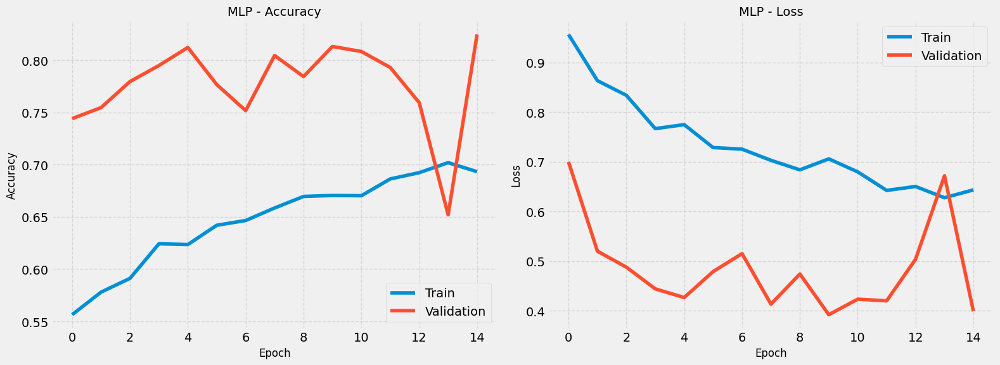

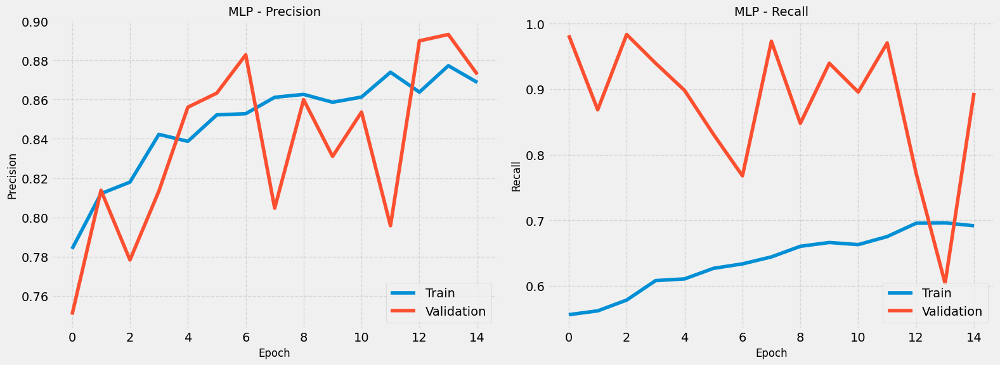

In [19]:

# Train the MLP model
mlp_history, mlp_history_dict, mlp_training_time = train_model(mlp_model, 'mlp', epochs=15)

# Plot training history
plot_training_history(mlp_history, 'MLP')


### Train CNN Model

Training cnn model...
Epoch 1/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8200 - loss: 0.6441 - precision_1: 0.9327 - recall_1: 0.8212
Epoch 1: val_loss improved from inf to 3.84110, saving model to cnn_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 231s 2s/step - accuracy: 0.8202 - loss: 0.6437 - precision_1: 0.9327 - recall_1: 0.8213 - val_accuracy: 0.7430 - val_loss: 3.8411 - val_precision_1: 0.7430 - val_recall_1: 1.0000 - learning_rate: 1.0000e-04
Epoch 2/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8495 - loss: 0.4832 - precision_1: 0.9470 - recall_1: 0.8426
Epoch 2: val_loss did not improve from 3.84110
131/131 ━━━━━━━━━━━━━━━━━━━━ 218s 2s/step - accuracy: 0.8495 - loss: 0.4832 - precision_1: 0.9470 - recall_1: 0.8426 - val_accuracy: 0.7430 - val_loss: 4.4482 - val_precision_1: 0.7430 - val_recall_1: 1.0000 - learning_rate: 1.0000e-04
Epoch 3/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8613 - loss: 0.4461 - precision_1: 0.9486 - recall_1: 0.8575
Epoch 3: val_loss did not improve from 3.84110
131/131 ━━━━━━━━━━━━━━━━━━━━ 212s 2s/step - accuracy: 0.8613 - loss: 0.4459 - precision_1: 0.9486 - recall_1: 0.8575 - val_accuracy: 0.7430 - val_loss: 3.9592 - val_precision_1: 0.74

131/131 ━━━━━━━━━━━━━━━━━━━━ 214s 2s/step - accuracy: 0.8676 - loss: 0.4104 - precision_1: 0.9511 - recall_1: 0.8666 - val_accuracy: 0.8533 - val_loss: 0.4381 - val_precision_1: 0.8403 - val_recall_1: 0.9910 - learning_rate: 1.0000e-04
Epoch 5/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8734 - loss: 0.4318 - precision_1: 0.9624 - recall_1: 0.8663
Epoch 5: val_loss did not improve from 0.43814
131/131 ━━━━━━━━━━━━━━━━━━━━ 212s 2s/step - accuracy: 0.8735 - loss: 0.4314 - precision_1: 0.9624 - recall_1: 0.8664 - val_accuracy: 0.8102 - val_loss: 0.7267 - val_precision_1: 0.7965 - val_recall_1: 1.0000 - learning_rate: 1.0000e-04
Epoch 6/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8866 - loss: 0.3323 - precision_1: 0.9683 - recall_1: 0.8763
Epoch 6: val_loss improved from 0.43814 to 0.22828, saving model to cnn_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 210s 2s/step - accuracy: 0.8866 - loss: 0.3323 - precision_1: 0.9683 - recall_1: 0.8763 - val_accuracy: 0.9070 - val_loss: 0.2283 - val_precision_1: 0.9942 - val_recall_1: 0.8800 - learning_rate: 1.0000e-04
Epoch 7/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8977 - loss: 0.2983 - precision_1: 0.9749 - recall_1: 0.8880
Epoch 7: val_loss improved from 0.22828 to 0.22027, saving model to cnn_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 211s 2s/step - accuracy: 0.8977 - loss: 0.2983 - precision_1: 0.9748 - recall_1: 0.8880 - val_accuracy: 0.9089 - val_loss: 0.2203 - val_precision_1: 0.9871 - val_recall_1: 0.8890 - learning_rate: 1.0000e-04
Epoch 8/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8981 - loss: 0.2659 - precision_1: 0.9701 - recall_1: 0.8906
Epoch 8: val_loss did not improve from 0.22027
131/131 ━━━━━━━━━━━━━━━━━━━━ 211s 2s/step - accuracy: 0.8981 - loss: 0.2661 - precision_1: 0.9701 - recall_1: 0.8906 - val_accuracy: 0.8514 - val_loss: 0.3839 - val_precision_1: 0.9968 - val_recall_1: 0.8026 - learning_rate: 1.0000e-04
Epoch 9/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8970 - loss: 0.2909 - precision_1: 0.9696 - recall_1: 0.8898
Epoch 9: val_loss did not improve from 0.22027
131/131 ━━━━━━━━━━━━━━━━━━━━ 210s 2s/step - accuracy: 0.8970 - loss: 0.2908 - precision_1: 0.9696 - recall_1: 0.8898 - val_accuracy: 0.8447 - val_loss: 0.3837 - val_precision_1: 1.00

131/131 ━━━━━━━━━━━━━━━━━━━━ 210s 2s/step - accuracy: 0.9223 - loss: 0.1875 - precision_1: 0.9757 - recall_1: 0.9189 - val_accuracy: 0.9243 - val_loss: 0.2000 - val_precision_1: 0.9971 - val_recall_1: 0.9006 - learning_rate: 2.0000e-05
Epoch 13/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9334 - loss: 0.1602 - precision_1: 0.9851 - recall_1: 0.9252
Epoch 13: val_loss improved from 0.20002 to 0.19781, saving model to cnn_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 212s 2s/step - accuracy: 0.9334 - loss: 0.1605 - precision_1: 0.9851 - recall_1: 0.9251 - val_accuracy: 0.9147 - val_loss: 0.1978 - val_precision_1: 0.9971 - val_recall_1: 0.8877 - learning_rate: 2.0000e-05
Epoch 14/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9255 - loss: 0.1768 - precision_1: 0.9833 - recall_1: 0.9153
Epoch 14: val_loss improved from 0.19781 to 0.13106, saving model to cnn_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 210s 2s/step - accuracy: 0.9255 - loss: 0.1768 - precision_1: 0.9833 - recall_1: 0.9152 - val_accuracy: 0.9492 - val_loss: 0.1311 - val_precision_1: 0.9788 - val_recall_1: 0.9523 - learning_rate: 2.0000e-05
Epoch 15/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9195 - loss: 0.2059 - precision_1: 0.9768 - recall_1: 0.9132
Epoch 15: val_loss did not improve from 0.13106
131/131 ━━━━━━━━━━━━━━━━━━━━ 171s 1s/step - accuracy: 0.9195 - loss: 0.2058 - precision_1: 0.9768 - recall_1: 0.9133 - val_accuracy: 0.9195 - val_loss: 0.2033 - val_precision_1: 0.9957 - val_recall_1: 0.8955 - learning_rate: 2.0000e-05
Epoch 16/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 625ms/step - accuracy: 0.9268 - loss: 0.1696 - precision_1: 0.9793 - recall_1: 0.9216
Epoch 16: val_loss did not improve from 0.13106
131/131 ━━━━━━━━━━━━━━━━━━━━ 94s 715ms/step - accuracy: 0.9269 - loss: 0.1696 - precision_1: 0.9793 - recall_1: 0.9216 - val_accuracy: 0.9166 - val_loss: 0.2095 - val_precisio

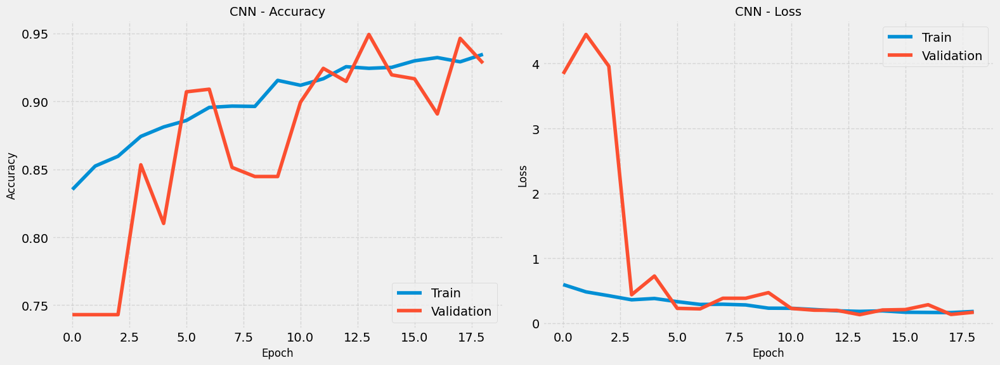

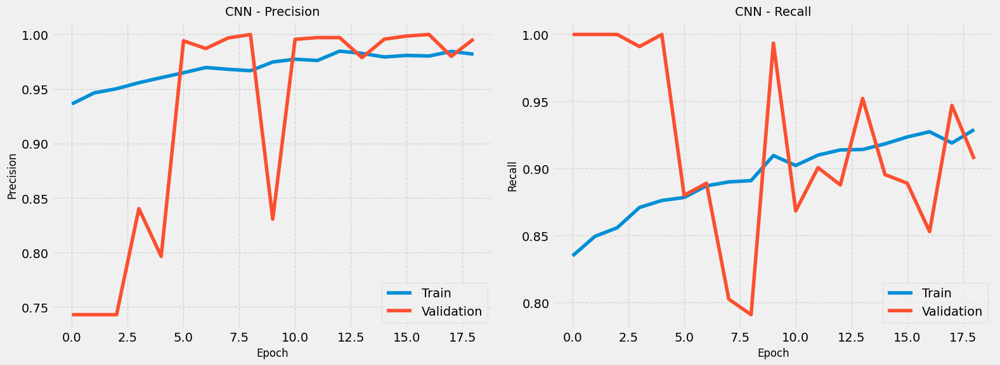

In [15]:

# Train the CNN model
cnn_history, cnn_history_dict, cnn_training_time = train_model(cnn_model, 'cnn', epochs=20)

# Plot training history
plot_training_history(cnn_history, 'CNN')


### Train ResNet Model

Training resnet model...
Epoch 1/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 718ms/step - accuracy: 0.5194 - loss: 0.7711 - precision_2: 0.7560 - recall_2: 0.5301
Epoch 1: val_loss improved from inf to 0.66265, saving model to resnet_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 123s 912ms/step - accuracy: 0.5194 - loss: 0.7710 - precision_2: 0.7560 - recall_2: 0.5300 - val_accuracy: 0.7574 - val_loss: 0.6627 - val_precision_2: 0.8686 - val_recall_2: 0.7935 - learning_rate: 1.0000e-04
Epoch 2/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 703ms/step - accuracy: 0.5221 - loss: 0.7313 - precision_2: 0.7548 - recall_2: 0.5303
Epoch 2: val_loss improved from 0.66265 to 0.61513, saving model to resnet_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 116s 887ms/step - accuracy: 0.5220 - loss: 0.7312 - precision_2: 0.7549 - recall_2: 0.5302 - val_accuracy: 0.7641 - val_loss: 0.6151 - val_precision_2: 0.7770 - val_recall_2: 0.9574 - learning_rate: 1.0000e-04
Epoch 3/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 713ms/step - accuracy: 0.5700 - loss: 0.6902 - precision_2: 0.7848 - recall_2: 0.5813
Epoch 3: val_loss did not improve from 0.61513
131/131 ━━━━━━━━━━━━━━━━━━━━ 117s 896ms/step - accuracy: 0.5701 - loss: 0.6901 - precision_2: 0.7849 - recall_2: 0.5813 - val_accuracy: 0.7267 - val_loss: 0.6443 - val_precision_2: 0.9043 - val_recall_2: 0.7071 - learning_rate: 1.0000e-04
Epoch 4/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 710ms/step - accuracy: 0.6088 - loss: 0.6584 - precision_2: 0.8179 - recall_2: 0.6089
Epoch 4: val_loss improved from 0.61513 to 0.60293, saving model to resnet_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 116s 882ms/step - accuracy: 0.6089 - loss: 0.6583 - precision_2: 0.8180 - recall_2: 0.6089 - val_accuracy: 0.7402 - val_loss: 0.6029 - val_precision_2: 0.8877 - val_recall_2: 0.7445 - learning_rate: 1.0000e-04
Epoch 5/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 688ms/step - accuracy: 0.6679 - loss: 0.6231 - precision_2: 0.8459 - recall_2: 0.6705
Epoch 5: val_loss improved from 0.60293 to 0.51807, saving model to resnet_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 113s 859ms/step - accuracy: 0.6681 - loss: 0.6230 - precision_2: 0.8461 - recall_2: 0.6706 - val_accuracy: 0.7593 - val_loss: 0.5181 - val_precision_2: 0.8259 - val_recall_2: 0.8568 - learning_rate: 1.0000e-04
Epoch 6/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 675ms/step - accuracy: 0.7271 - loss: 0.5720 - precision_2: 0.8722 - recall_2: 0.7390
Epoch 6: val_loss did not improve from 0.51807
131/131 ━━━━━━━━━━━━━━━━━━━━ 111s 847ms/step - accuracy: 0.7271 - loss: 0.5719 - precision_2: 0.8722 - recall_2: 0.7390 - val_accuracy: 0.6692 - val_loss: 0.6479 - val_precision_2: 0.9555 - val_recall_2: 0.5819 - learning_rate: 1.0000e-04
Epoch 7/20
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 673ms/step - accuracy: 0.7409 - loss: 0.5434 - precision_2: 0.8990 - recall_2: 0.7378
Epoch 7: val_loss did not improve from 0.51807
131/131 ━━━━━━━━━━━━━━━━━━━━ 110s 842ms/step - accuracy: 0.7410 - loss: 0.5434 - precision_2: 0.8990 - recall_2: 0.7379 - val_accuracy: 0.7037 - val_loss: 0.6214 - val_pr

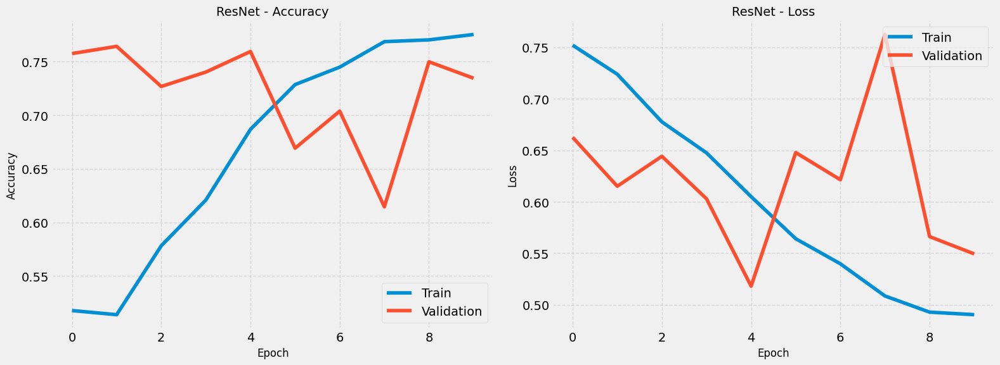

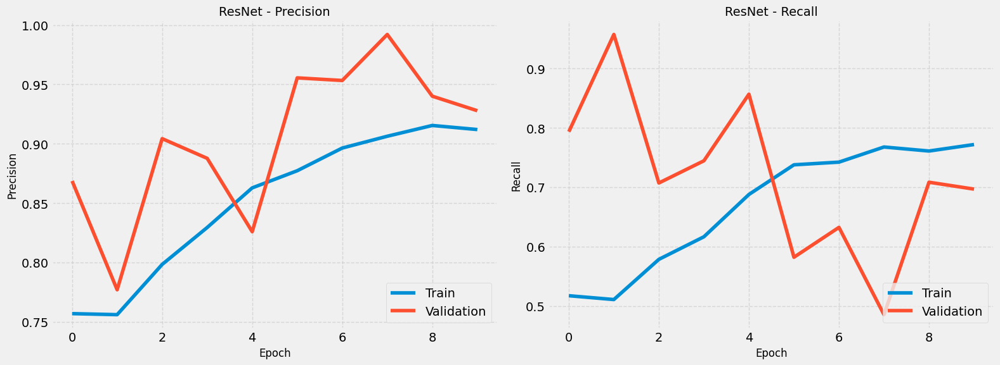

Fine-tuning ResNet model...
Training resnet_finetuned model...
Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 832ms/step - accuracy: 0.7424 - loss: 0.5023 - precision_3: 0.9222 - recall_3: 0.7116
Epoch 1: val_loss improved from inf to 0.78221, saving model to resnet_finetuned_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.7430 - loss: 0.5014 - precision_3: 0.9224 - recall_3: 0.7123 - val_accuracy: 0.4650 - val_loss: 0.7822 - val_precision_3: 1.0000 - val_recall_3: 0.2800 - learning_rate: 1.0000e-05
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 814ms/step - accuracy: 0.8746 - loss: 0.2898 - precision_3: 0.9700 - recall_3: 0.8586
Epoch 2: val_loss improved from 0.78221 to 0.38209, saving model to resnet_finetuned_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 130s 990ms/step - accuracy: 0.8746 - loss: 0.2898 - precision_3: 0.9700 - recall_3: 0.8585 - val_accuracy: 0.8428 - val_loss: 0.3821 - val_precision_3: 0.9967 - val_recall_3: 0.7910 - learning_rate: 1.0000e-05
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 817ms/step - accuracy: 0.8657 - loss: 0.2826 - precision_3: 0.9631 - recall_3: 0.8516
Epoch 3: val_loss did not improve from 0.38209
131/131 ━━━━━━━━━━━━━━━━━━━━ 129s 987ms/step - accuracy: 0.8657 - loss: 0.2826 - precision_3: 0.9631 - recall_3: 0.8517 - val_accuracy: 0.7344 - val_loss: 0.6726 - val_precision_3: 0.9980 - val_recall_3: 0.6439 - learning_rate: 1.0000e-05
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 815ms/step - accuracy: 0.8639 - loss: 0.2667 - precision_3: 0.9745 - recall_3: 0.8398
Epoch 4: val_loss improved from 0.38209 to 0.25306, saving model to resnet_finetuned_best_model.h5


131/131 ━━━━━━━━━━━━━━━━━━━━ 130s 988ms/step - accuracy: 0.8640 - loss: 0.2668 - precision_3: 0.9745 - recall_3: 0.8400 - val_accuracy: 0.8878 - val_loss: 0.2531 - val_precision_3: 0.9853 - val_recall_3: 0.8619 - learning_rate: 1.0000e-05
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 816ms/step - accuracy: 0.8821 - loss: 0.2668 - precision_3: 0.9725 - recall_3: 0.8644
Epoch 5: val_loss did not improve from 0.25306
131/131 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step - accuracy: 0.8821 - loss: 0.2668 - precision_3: 0.9725 - recall_3: 0.8644 - val_accuracy: 0.7383 - val_loss: 0.6606 - val_precision_3: 1.0000 - val_recall_3: 0.6477 - learning_rate: 1.0000e-05
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 825ms/step - accuracy: 0.8823 - loss: 0.2623 - precision_3: 0.9693 - recall_3: 0.8707
Epoch 6: val_loss did not improve from 0.25306
131/131 ━━━━━━━━━━━━━━━━━━━━ 131s 997ms/step - accuracy: 0.8822 - loss: 0.2623 - precision_3: 0.9694 - recall_3: 0.8707 - val_accuracy: 0.6654 - val_loss: 0.7388 - val_preci

131/131 ━━━━━━━━━━━━━━━━━━━━ 130s 992ms/step - accuracy: 0.8928 - loss: 0.2392 - precision_3: 0.9745 - recall_3: 0.8768 - val_accuracy: 0.9137 - val_loss: 0.2025 - val_precision_3: 0.9635 - val_recall_3: 0.9187 - learning_rate: 1.0000e-05
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 827ms/step - accuracy: 0.9024 - loss: 0.2345 - precision_3: 0.9769 - recall_3: 0.8882
Epoch 8: val_loss did not improve from 0.20248
131/131 ━━━━━━━━━━━━━━━━━━━━ 131s 997ms/step - accuracy: 0.9024 - loss: 0.2346 - precision_3: 0.9769 - recall_3: 0.8881 - val_accuracy: 0.7191 - val_loss: 0.8292 - val_precision_3: 1.0000 - val_recall_3: 0.6219 - learning_rate: 1.0000e-05
Epoch 9/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 0s 819ms/step - accuracy: 0.8817 - loss: 0.2658 - precision_3: 0.9698 - recall_3: 0.8674
Epoch 9: val_loss did not improve from 0.20248
131/131 ━━━━━━━━━━━━━━━━━━━━ 130s 989ms/step - accuracy: 0.8817 - loss: 0.2657 - precision_3: 0.9698 - recall_3: 0.8674 - val_accuracy: 0.8025 - val_loss: 0.4679 - val_pr

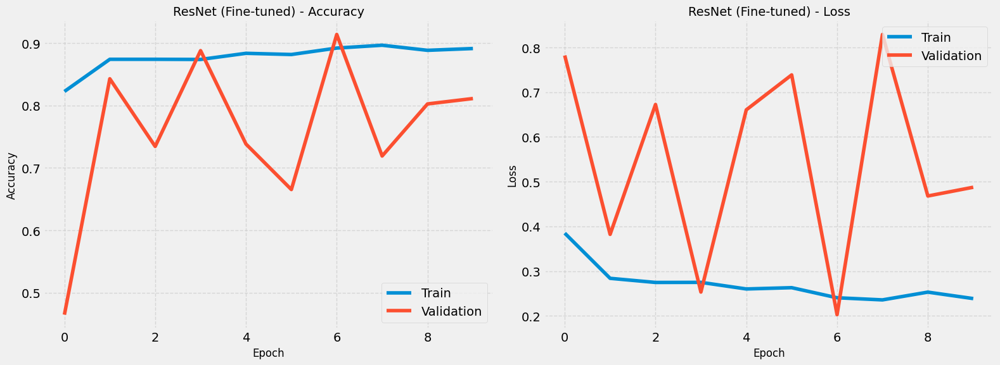

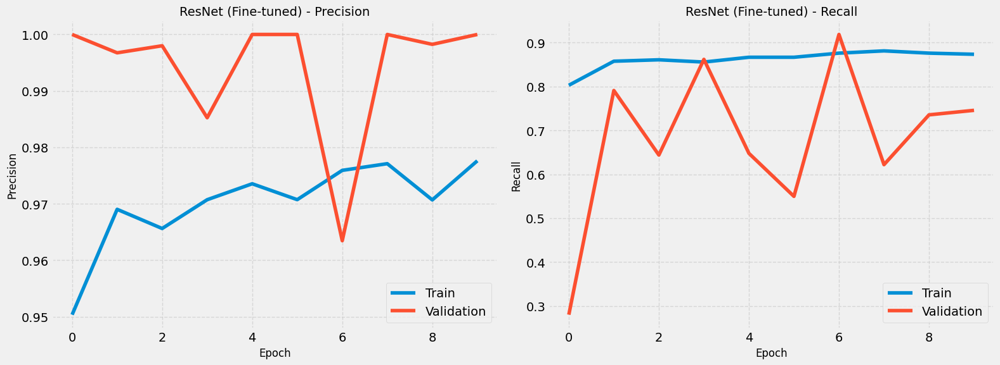

In [16]:

# Train the ResNet model
resnet_history, resnet_history_dict, resnet_training_time = train_model(resnet_model, 'resnet', epochs=20)

# Plot training history
plot_training_history(resnet_history, 'ResNet')

# Fine-tune the ResNet model
# Unfreeze some of the top layers of the base model
for layer in base_model.layers[-30:]:
    layer.trainable = True

# Recompile the model with a lower learning rate
resnet_model.compile(
    optimizer=Adam(learning_rate=1e-5),  # Lower learning rate for fine-tuning
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

print("Fine-tuning ResNet model...")
ft_resnet_history, ft_resnet_history_dict, ft_resnet_training_time = train_model(
    resnet_model, 'resnet_finetuned', epochs=10
)

# Plot fine-tuned training history
plot_training_history(ft_resnet_history, 'ResNet (Fine-tuned)')


## Model Evaluation

Evaluating MLP model on test data...
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step

MLP Evaluation Results:
Accuracy: 0.7628
Precision (Normal): 0.6693
Recall (Normal): 0.7265
F1-score (Normal): 0.6967
Precision (Pneumonia): 0.8270
Recall (Pneumonia): 0.7846
F1-score (Pneumonia): 0.8053
ROC AUC: 0.8317


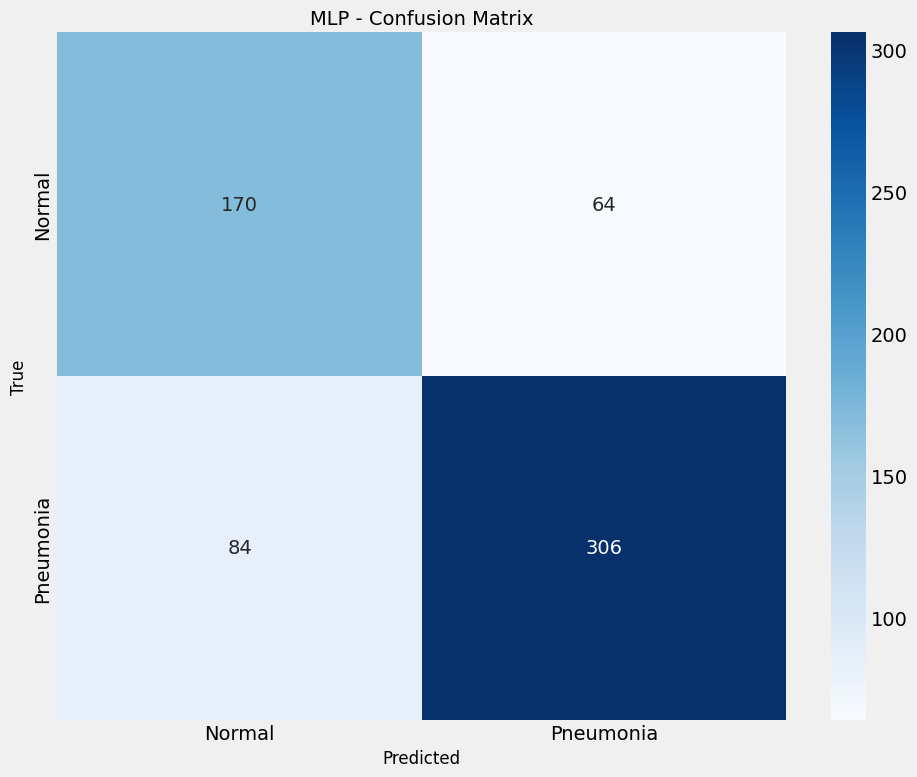

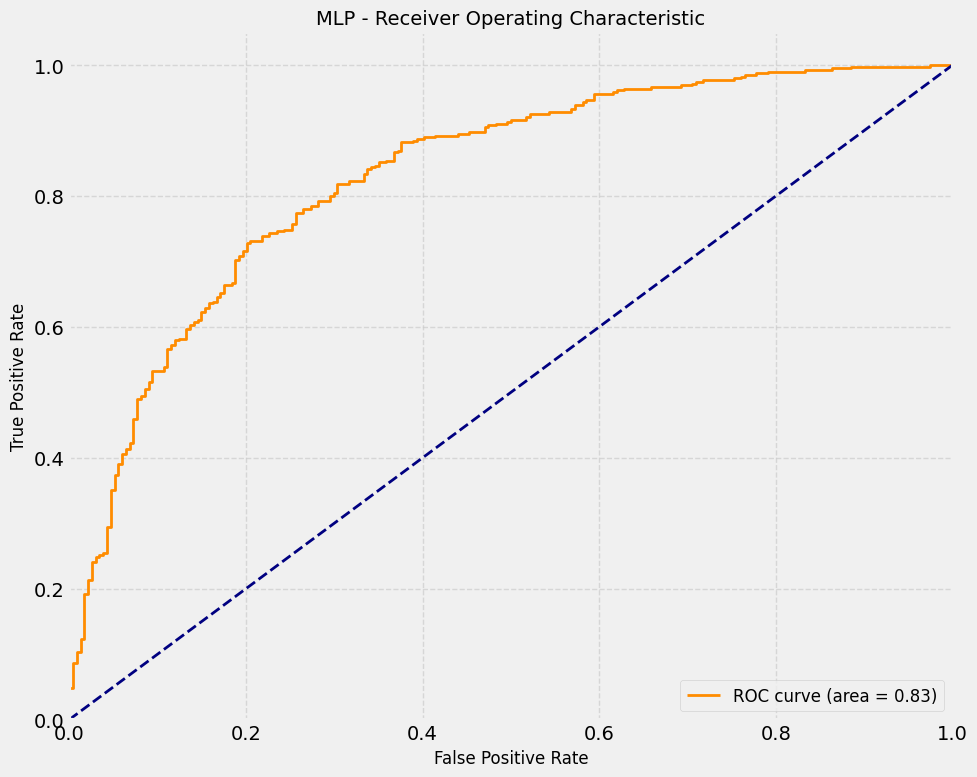

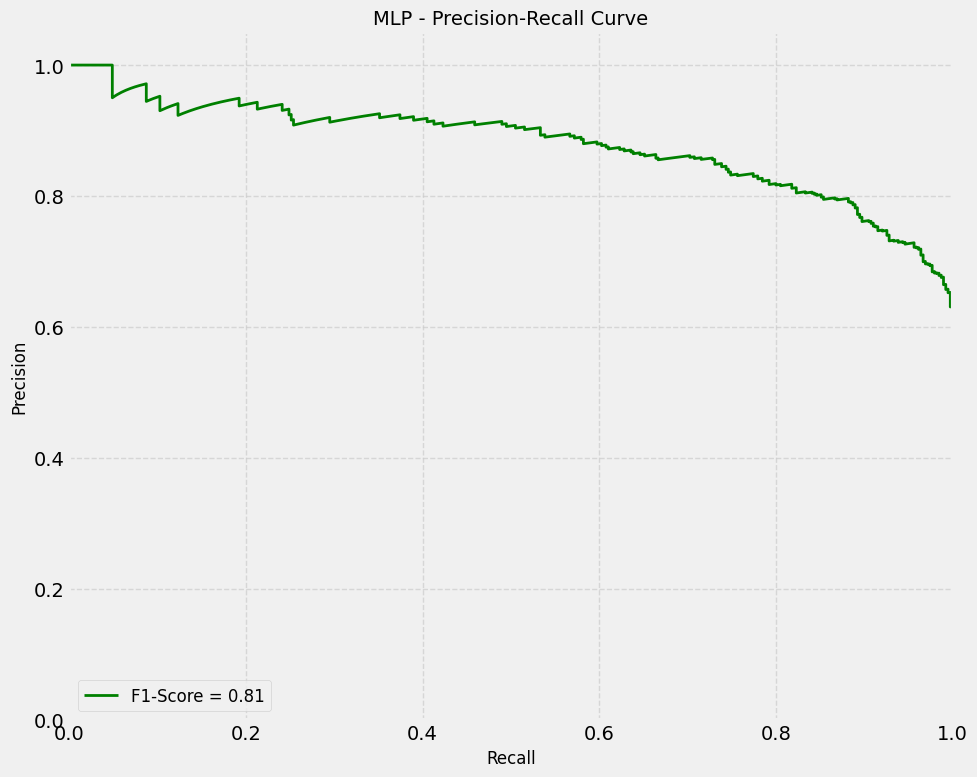

Evaluating CNN model on test data...
20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 202ms/step

CNN Evaluation Results:
Accuracy: 0.8718
Precision (Normal): 0.8182
Recall (Normal): 0.8462
F1-score (Normal): 0.8319
Precision (Pneumonia): 0.9058
Recall (Pneumonia): 0.8872
F1-score (Pneumonia): 0.8964
ROC AUC: 0.9355


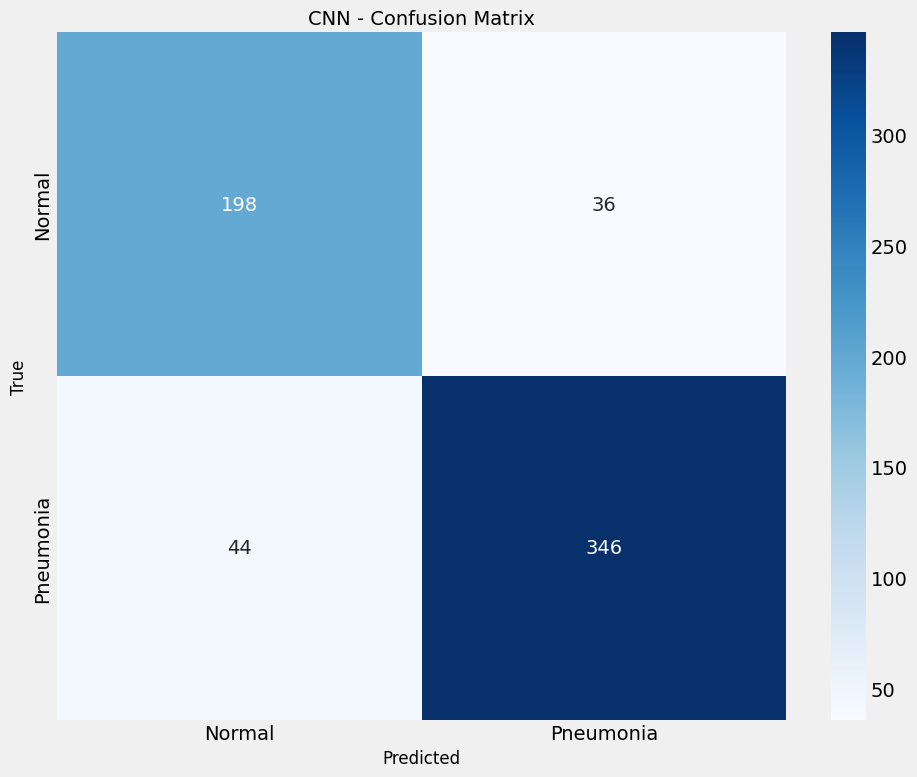

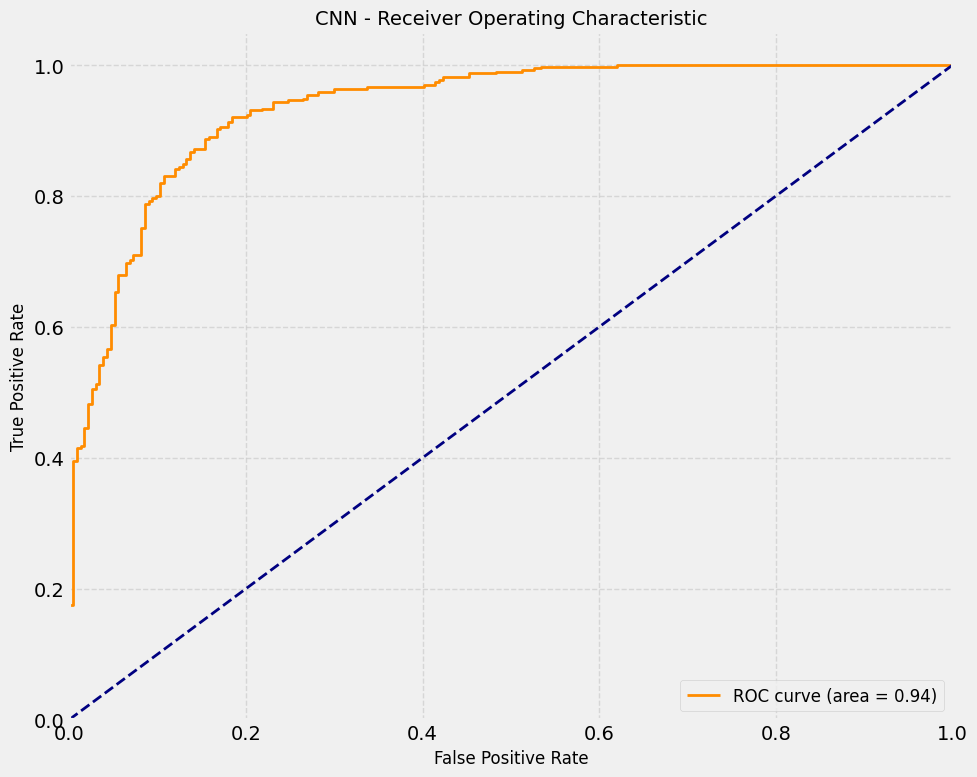

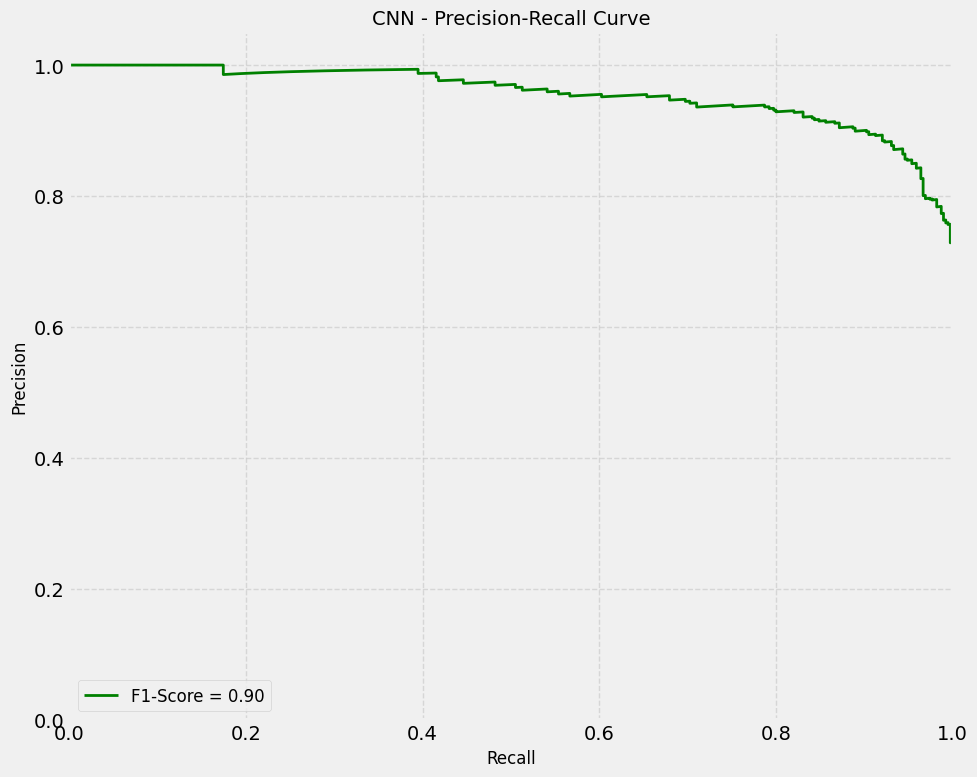

Evaluating ResNet model on test data...
20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 602ms/step

ResNet Evaluation Results:
Accuracy: 0.8670
Precision (Normal): 0.8578
Recall (Normal): 0.7735
F1-score (Normal): 0.8135
Precision (Pneumonia): 0.8717
Recall (Pneumonia): 0.9231
F1-score (Pneumonia): 0.8966
ROC AUC: 0.9357


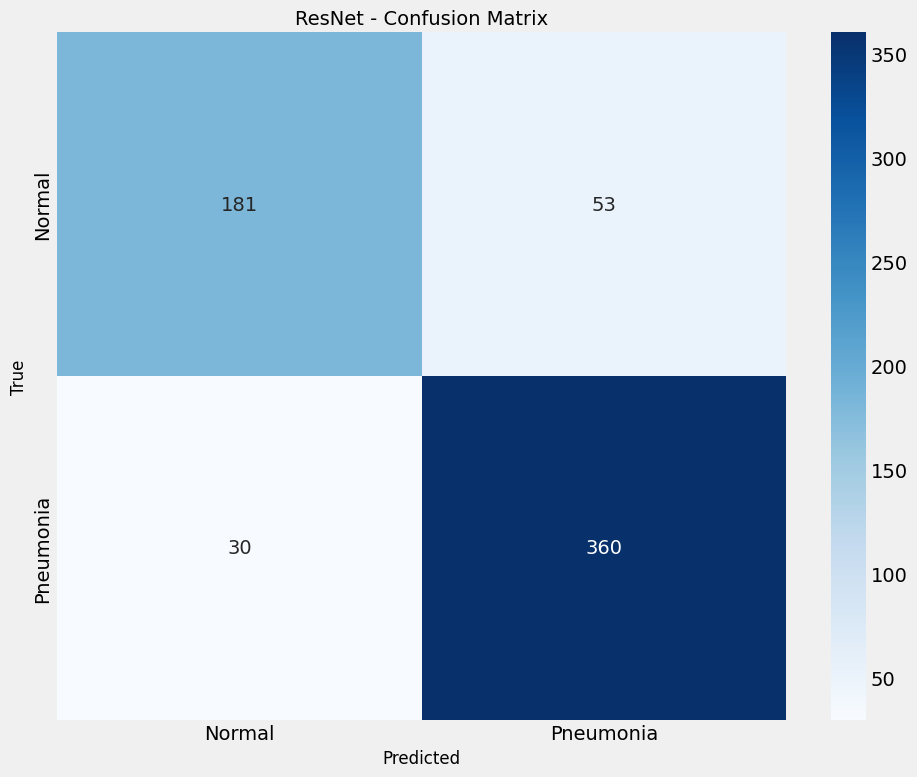

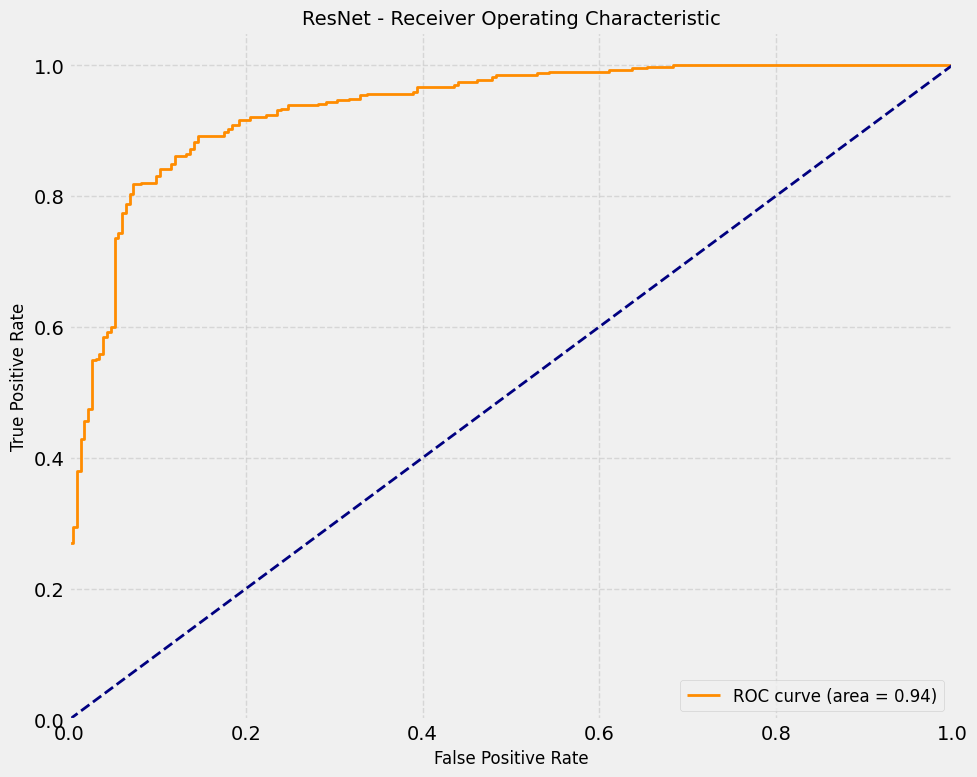

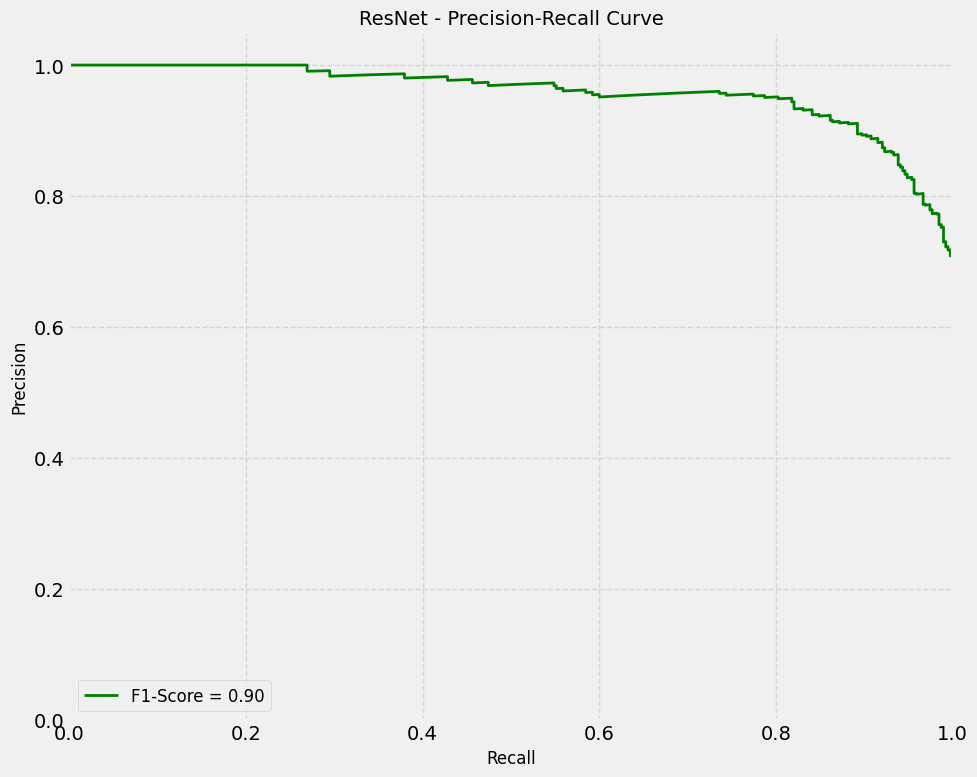

In [20]:

def evaluate_model(model, model_name, generator):
    """Evaluate a model on the test set and generate evaluation metrics."""
    # Predict on test data
    print(f"Evaluating {model_name} model on test data...")
    y_pred_prob = model.predict(generator, verbose=1)
    y_pred = (y_pred_prob > 0.5).astype(int)
    y_true = generator.classes

    # Calculate metrics
    conf_matrix = confusion_matrix(y_true, y_pred)
    class_report = classification_report(y_true, y_pred, target_names=['Normal', 'Pneumonia'], output_dict=True)

    # Calculate ROC curve and AUC
    fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    # Calculate precision-recall curve
    precision, recall, _ = precision_recall_curve(y_true, y_pred_prob)
    f1 = f1_score(y_true, y_pred)

    # Print evaluation results
    print(f"\n{model_name} Evaluation Results:")
    print(f"Accuracy: {class_report['accuracy']:.4f}")
    print(f"Precision (Normal): {class_report['Normal']['precision']:.4f}")
    print(f"Recall (Normal): {class_report['Normal']['recall']:.4f}")
    print(f"F1-score (Normal): {class_report['Normal']['f1-score']:.4f}")
    print(f"Precision (Pneumonia): {class_report['Pneumonia']['precision']:.4f}")
    print(f"Recall (Pneumonia): {class_report['Pneumonia']['recall']:.4f}")
    print(f"F1-score (Pneumonia): {class_report['Pneumonia']['f1-score']:.4f}")
    print(f"ROC AUC: {roc_auc:.4f}")

    # Visualization of results
    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                xticklabels=['Normal', 'Pneumonia'], 
                yticklabels=['Normal', 'Pneumonia'])
    plt.xlabel('Predicted', fontsize=12)
    plt.ylabel('True', fontsize=12)
    plt.title(f'{model_name} - Confusion Matrix', fontsize=14)
    plt.tight_layout()
    plt.savefig(f'{model_name}_confusion_matrix.png')
    plt.show()

    # Plot ROC curve
    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title(f'{model_name} - Receiver Operating Characteristic', fontsize=14)
    plt.legend(loc='lower right', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f'{model_name}_roc_curve.png')
    plt.show()

    # Plot precision-recall curve
    plt.figure(figsize=(10, 8))
    plt.plot(recall, precision, color='green', lw=2, label=f'F1-Score = {f1:.2f}')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall', fontsize=12)
    plt.ylabel('Precision', fontsize=12)
    plt.title(f'{model_name} - Precision-Recall Curve', fontsize=14)
    plt.legend(loc='lower left', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f'{model_name}_precision_recall_curve.png')
    plt.show()

    # Return evaluation metrics
    return {
        'accuracy': class_report['accuracy'],
        'precision_normal': class_report['Normal']['precision'],
        'recall_normal': class_report['Normal']['recall'],
        'f1_normal': class_report['Normal']['f1-score'],
        'precision_pneumonia': class_report['Pneumonia']['precision'],
        'recall_pneumonia': class_report['Pneumonia']['recall'],
        'f1_pneumonia': class_report['Pneumonia']['f1-score'],
        'roc_auc': roc_auc,
        'f1_score': f1,
        'confusion_matrix': conf_matrix.tolist()
    }

# Evaluate all models
mlp_eval = evaluate_model(mlp_model, 'MLP', test_generator)
cnn_eval = evaluate_model(cnn_model, 'CNN', test_generator)
resnet_eval = evaluate_model(resnet_model, 'ResNet', test_generator)


## Key Observations

MLP:

- The MLP model showed moderate performance, with an overall accuracy of 76.28% and ROC AUC of 0.83. It struggled more with classifying 'Normal' cases compared to 'Pneumonia'.

CNN:

- The CNN model achieved the highest accuracy (87.18%) and performed well across all metrics, with a balanced F1-score and ROC AUC of 0.9355.

ResNet:

- ResNet achieved comparable results to CNN with slightly higher ROC AUC (0.9357), although its recall for the 'Normal' class was slightly lower, indicating a tendency to misclassify normal cases.

### Compare Models

Model Comparison:
    Model  Accuracy  Precision (Normal)  Recall (Normal)  F1-score (Normal)  \
0     MLP  0.762821            0.669291         0.726496           0.696721   
1     CNN  0.871795            0.818182         0.846154           0.831933   
2  ResNet  0.866987            0.857820         0.773504           0.813483   

   Precision (Pneumonia)  Recall (Pneumonia)  F1-score (Pneumonia)   ROC AUC  \
0               0.827027            0.784615              0.805263  0.831657   
1               0.905759            0.887179              0.896373  0.935547   
2               0.871671            0.923077              0.896638  0.935689   

   Training Time (s)  
0        1101.350765  
1        3533.747973  
2        1138.139820  


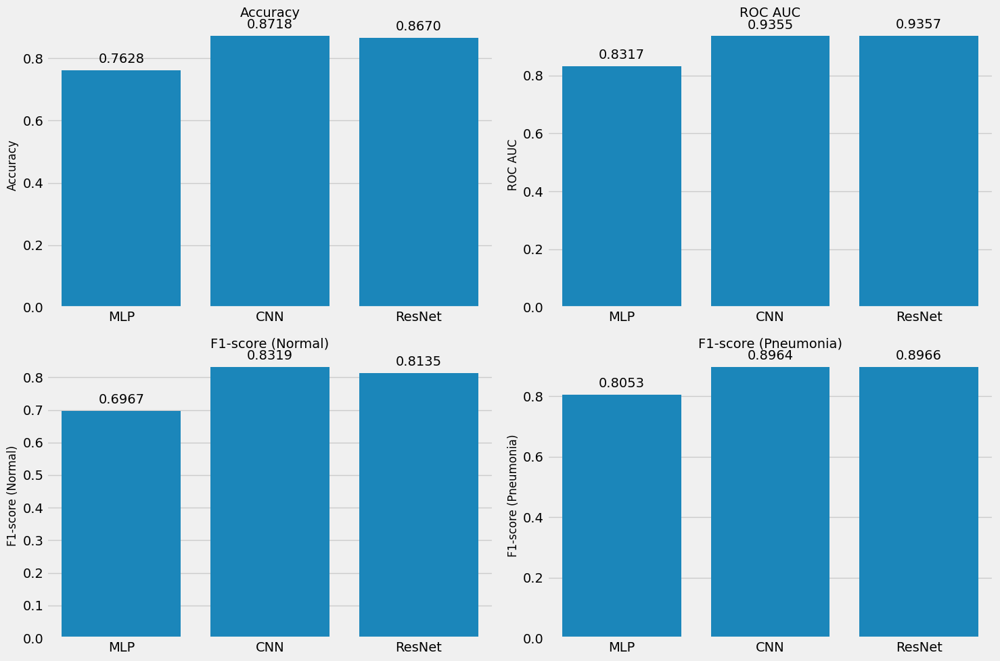

In [21]:

# Combine all evaluation results
model_comparison = {
    'Model': ['MLP', 'CNN', 'ResNet'],
    'Accuracy': [mlp_eval['accuracy'], cnn_eval['accuracy'], resnet_eval['accuracy']],
    'Precision (Normal)': [mlp_eval['precision_normal'], cnn_eval['precision_normal'], resnet_eval['precision_normal']],
    'Recall (Normal)': [mlp_eval['recall_normal'], cnn_eval['recall_normal'], resnet_eval['recall_normal']],
    'F1-score (Normal)': [mlp_eval['f1_normal'], cnn_eval['f1_normal'], resnet_eval['f1_normal']],
    'Precision (Pneumonia)': [mlp_eval['precision_pneumonia'], cnn_eval['precision_pneumonia'], resnet_eval['precision_pneumonia']],
    'Recall (Pneumonia)': [mlp_eval['recall_pneumonia'], cnn_eval['recall_pneumonia'], resnet_eval['recall_pneumonia']],
    'F1-score (Pneumonia)': [mlp_eval['f1_pneumonia'], cnn_eval['f1_pneumonia'], resnet_eval['f1_pneumonia']],
    'ROC AUC': [mlp_eval['roc_auc'], cnn_eval['roc_auc'], resnet_eval['roc_auc']],
    'Training Time (s)': [mlp_training_time, cnn_training_time, resnet_training_time]
}

# Convert to DataFrame
comparison_df = pd.DataFrame(model_comparison)
print("Model Comparison:")
print(comparison_df)

# Save comparison to CSV
comparison_df.to_csv('model_comparison.csv', index=False)

# Visualize comparison
metrics = ['Accuracy', 'ROC AUC', 'F1-score (Normal)', 'F1-score (Pneumonia)']
plt.figure(figsize=(15, 10))

for i, metric in enumerate(metrics):
    plt.subplot(2, 2, i+1)
    ax = sns.barplot(x='Model', y=metric, data=comparison_df)
    plt.title(metric, fontsize=14)
    plt.xlabel('')
    plt.ylabel(metric, fontsize=12)

    # Add data labels on top of bars
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.4f}', 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'bottom', 
                   xytext = (0, 5), 
                   textcoords = 'offset points')

plt.tight_layout()
plt.savefig('model_comparison.png')
plt.show()


## Model Comparison and Final Evaluation

We evaluate each model on the test set using accuracy, precision, recall, F1-score, and ROC AUC.  
Confusion matrices, ROC curves, and precision-recall curves help visualize the performance.  

From the results, the CNN and ResNet models outperform the MLP, showing better ability to classify pneumonia from chest X-rays.



## Explainable AI (XAI) Implementation

One of the key requirements of this assignment is to implement Explainable AI (XAI) techniques to provide insights into the model's predictions. This is particularly important in medical applications, where understanding why a model made a specific prediction can be crucial for clinical decision-making.

## Model Focus Comparison Using Occlusion Sensitivity

Comparing how the CNN and ResNet models focus on important regions in chest X-ray images by using occlusion sensitivity.  
This method occludes parts of the input image and measures the change in model prediction, highlighting areas critical for classification.  
Heatmaps show which regions influence the model’s decision, allowing to visually compare model attention and interpretability.


Comparing models on IM-0087-0001.jpeg...


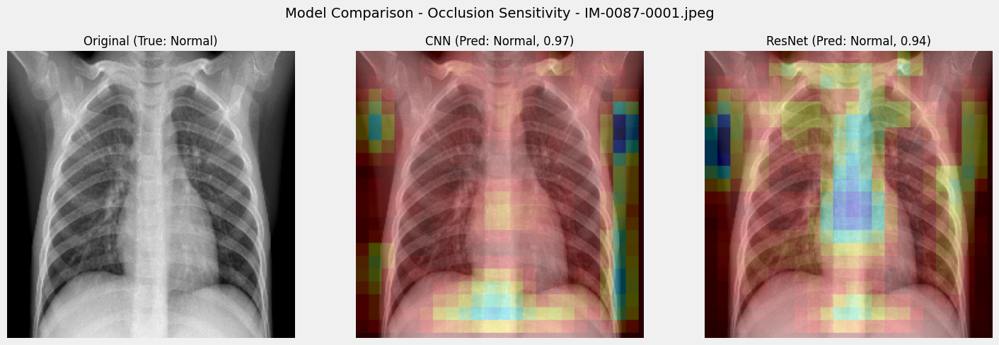

Results: [{'model': 'CNN', 'true_label': 'Normal', 'pred_label': 'Normal', 'confidence': 0.9702321290969849, 'correct': True}, {'model': 'ResNet', 'true_label': 'Normal', 'pred_label': 'Normal', 'confidence': 0.9389658570289612, 'correct': True}]

Comparing models on NORMAL2-IM-0300-0001.jpeg...


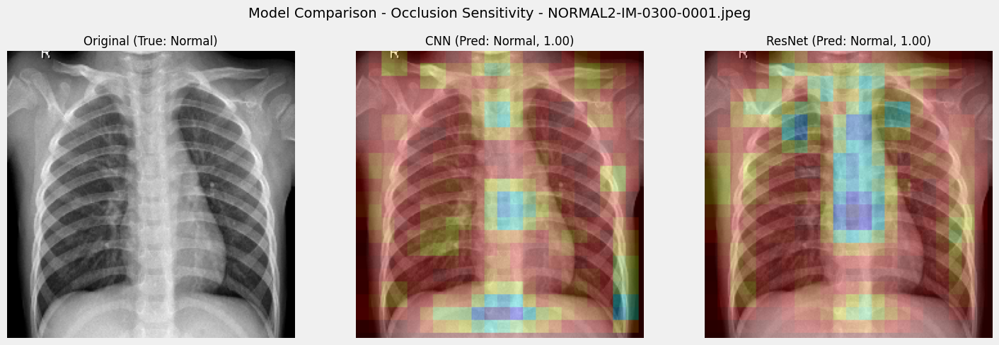

Results: [{'model': 'CNN', 'true_label': 'Normal', 'pred_label': 'Normal', 'confidence': 0.9952640533447266, 'correct': True}, {'model': 'ResNet', 'true_label': 'Normal', 'pred_label': 'Normal', 'confidence': 0.995500922203064, 'correct': True}]

Comparing models on person130_bacteria_623.jpeg...


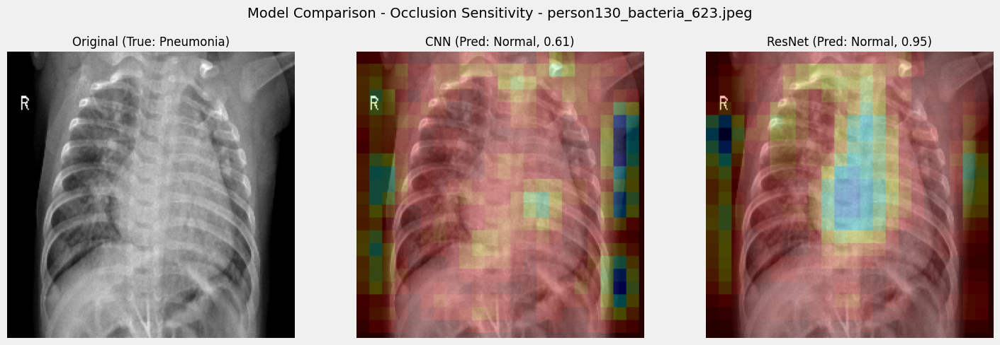

Results: [{'model': 'CNN', 'true_label': 'Pneumonia', 'pred_label': 'Normal', 'confidence': 0.6144672632217407, 'correct': False}, {'model': 'ResNet', 'true_label': 'Pneumonia', 'pred_label': 'Normal', 'confidence': 0.9541143774986267, 'correct': False}]

Comparing models on person173_bacteria_829.jpeg...


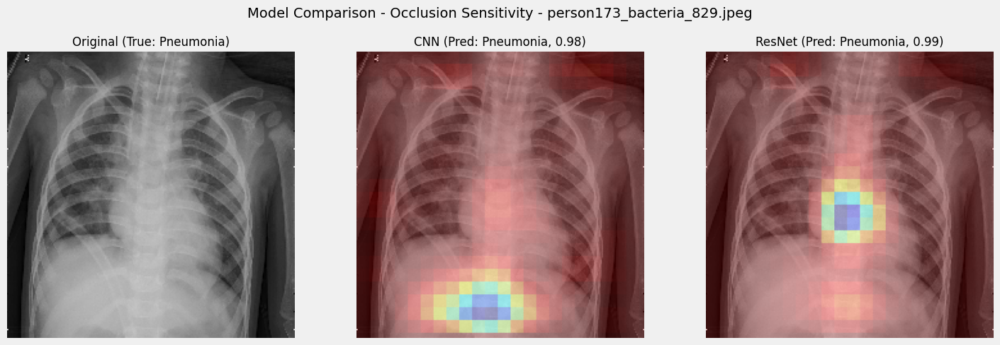

Results: [{'model': 'CNN', 'true_label': 'Pneumonia', 'pred_label': 'Pneumonia', 'confidence': 0.9823682904243469, 'correct': True}, {'model': 'ResNet', 'true_label': 'Pneumonia', 'pred_label': 'Pneumonia', 'confidence': 0.9863322377204895, 'correct': True}]

Model Comparison Results:
    model true_label pred_label  confidence  correct
0     CNN     Normal     Normal    0.970232     True
1  ResNet     Normal     Normal    0.938966     True
2     CNN     Normal     Normal    0.995264     True
3  ResNet     Normal     Normal    0.995501     True
4     CNN  Pneumonia     Normal    0.614467    False
5  ResNet  Pneumonia     Normal    0.954114    False
6     CNN  Pneumonia  Pneumonia    0.982368     True
7  ResNet  Pneumonia  Pneumonia    0.986332     True
CNN accuracy on sample images: 75.00%
ResNet accuracy on sample images: 75.00%


In [34]:
# Compare model focus areas for the same images using occlusion sensitivity
def compare_model_focus_occlusion(img_path):
    """
    Compare how different models focus on the same image using occlusion sensitivity
    """
    # Load and preprocess the image
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize to [0,1]

    # Extract true label from filename
    true_label = "Pneumonia" if "PNEUMONIA" in img_path else "Normal"

    plt.figure(figsize=(15, 5))

    # Display original image
    plt.subplot(1, 3, 1)
    plt.imshow(img_array[0])
    plt.title(f"Original (True: {true_label})", fontsize=12)
    plt.axis('off')

    # Generate occlusion sensitivity maps for both models
    models = [
        (cnn_model, "CNN"),
        (resnet_model, "ResNet")
    ]

    results = []

    for i, (model, model_name) in enumerate(models):
        # Get the original prediction
        orig_pred = model.predict(img_array, verbose=0)[0][0]

        # Create a heatmap of the same size as the image
        heatmap = np.zeros((IMG_HEIGHT, IMG_WIDTH))

        # Define the size of the occlusion patch
        patch_size = 20

        # Define the stride (how many pixels to move the patch each time)
        stride = 10

        # Iterate over the image with the occlusion patch
        for y in range(0, IMG_HEIGHT - patch_size, stride):
            for x in range(0, IMG_WIDTH - patch_size, stride):
                # Create a copy of the image
                occluded_img = img_array.copy()

                # Apply the occlusion patch (set to gray)
                occluded_img[0, y:y+patch_size, x:x+patch_size, :] = 0.5

                # Get the prediction for the occluded image
                occluded_pred = model.predict(occluded_img, verbose=0)[0][0]

                # Calculate the difference in prediction
                diff = abs(orig_pred - occluded_pred)

                # Update the heatmap
                heatmap[y:y+patch_size, x:x+patch_size] += diff

        # Normalize the heatmap
        heatmap = heatmap / np.max(heatmap) if np.max(heatmap) > 0 else heatmap

        # Convert heatmap to RGB
        heatmap_rgb = np.uint8(255 * heatmap)
        heatmap_rgb = cv2.applyColorMap(heatmap_rgb, cv2.COLORMAP_JET)
        heatmap_rgb = heatmap_rgb / 255.0

        # Superimpose the heatmap on original image
        superimposed_img = heatmap_rgb * 0.4 + img_array[0]
        superimposed_img = superimposed_img / superimposed_img.max()

        # Determine prediction
        pred_label = "Pneumonia" if orig_pred > 0.5 else "Normal"
        confidence = orig_pred if orig_pred > 0.5 else 1 - orig_pred

        # Add result to list
        results.append({
            'model': model_name,
            'true_label': true_label,
            'pred_label': pred_label,
            'confidence': float(confidence),
            'correct': true_label == pred_label
        })

        # Display result
        plt.subplot(1, 3, i + 2)
        plt.imshow(superimposed_img)
        plt.title(f"{model_name} (Pred: {pred_label}, {confidence:.2f})", fontsize=12)
        plt.axis('off')

    plt.suptitle(f"Model Comparison - Occlusion Sensitivity - {os.path.basename(img_path)}", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"model_comparison_{os.path.basename(img_path)}.png")
    plt.show()

    return results

# Compare CNN and ResNet on the same images
all_comparison_results = []
for img_path in all_samples[:4]:  # Use first 4 samples for comparison
    print(f"Comparing models on {os.path.basename(img_path)}...")
    comparison_results = compare_model_focus_occlusion(img_path)
    all_comparison_results.extend(comparison_results)
    print("Results:", comparison_results)
    print()

# Create a DataFrame of all comparison results
comparison_df = pd.DataFrame(all_comparison_results)
print("Model Comparison Results:")
print(comparison_df)

# Calculate accuracy by model
cnn_results = comparison_df[comparison_df['model'] == 'CNN']
resnet_results = comparison_df[comparison_df['model'] == 'ResNet']

print(f"CNN accuracy on sample images: {cnn_results['correct'].mean() * 100:.2f}%")
print(f"ResNet accuracy on sample images: {resnet_results['correct'].mean() * 100:.2f}%")

### Apply Occlusion sensitivity to CNN Model

Processing IM-0087-0001.jpeg...


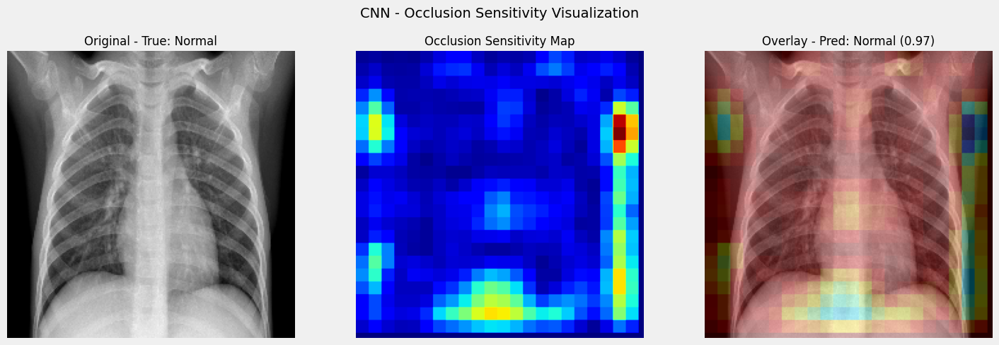

Processing NORMAL2-IM-0300-0001.jpeg...


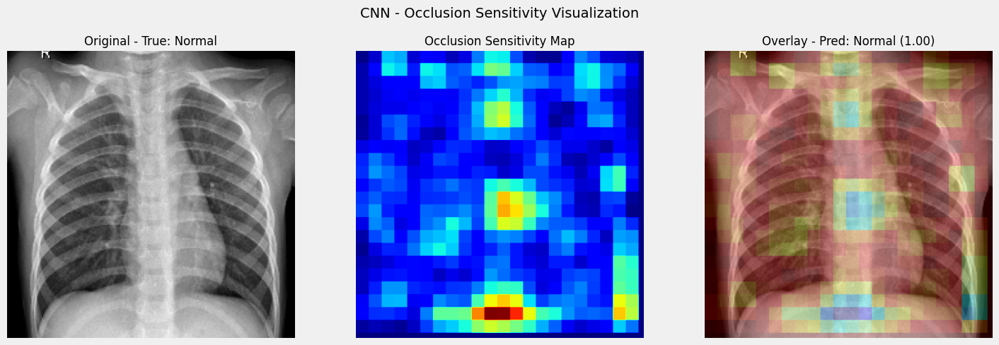

Processing person130_bacteria_623.jpeg...


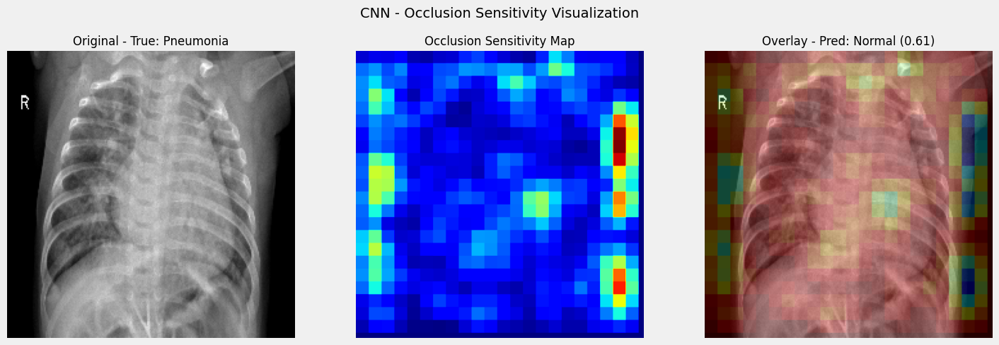

Processing person173_bacteria_829.jpeg...


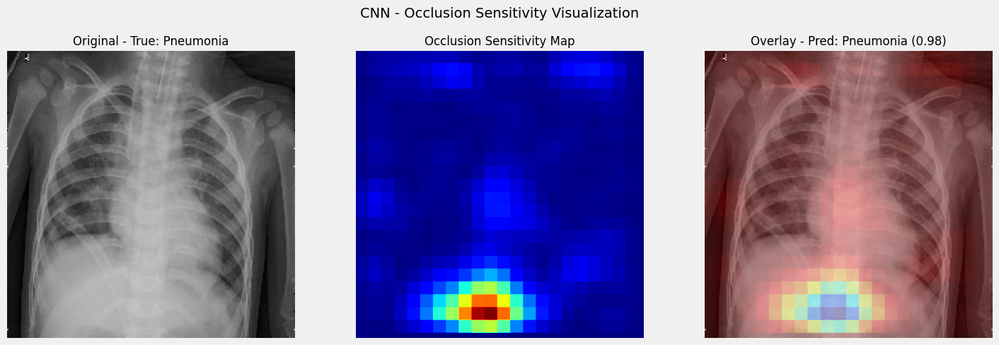

CNN Occlusion Sensitivity Results:
                         image true_label pred_label  confidence  correct
0            IM-0087-0001.jpeg     Normal     Normal    0.970232     True
1    NORMAL2-IM-0300-0001.jpeg     Normal     Normal    0.995264     True
2  person130_bacteria_623.jpeg  Pneumonia     Normal    0.614467    False
3  person173_bacteria_829.jpeg  Pneumonia  Pneumonia    0.982368     True
Correct predictions: 3/4 (75.00%)


In [35]:
def simple_xai_visualization(model, img_path):
    """
    A simple XAI visualization that doesn't rely on creating a new model
    """
    # Load and preprocess the image
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize to [0,1]
    
    # Make a prediction with the model
    pred = model.predict(img_array, verbose=0)[0][0]
    pred_label = "Pneumonia" if pred > 0.5 else "Normal"
    confidence = pred if pred > 0.5 else 1 - pred
    
    # Extract true label from filename
    true_label = "Pneumonia" if "PNEUMONIA" in img_path else "Normal"
    
    # Create a perturbation-based visualization
    # We'll create a heatmap by occluding different parts of the image
    # and seeing how the prediction changes
    
    # Create a heatmap of the same size as the image
    heatmap = np.zeros((IMG_HEIGHT, IMG_WIDTH))
    
    # Define the size of the occlusion patch
    patch_size = 20
    
    # Define the stride (how many pixels to move the patch each time)
    stride = 10
    
    # Iterate over the image with the occlusion patch
    for y in range(0, IMG_HEIGHT - patch_size, stride):
        for x in range(0, IMG_WIDTH - patch_size, stride):
            # Create a copy of the image
            occluded_img = img_array.copy()
            
            # Apply the occlusion patch (set to gray)
            occluded_img[0, y:y+patch_size, x:x+patch_size, :] = 0.5
            
            # Get the prediction for the occluded image
            occluded_pred = model.predict(occluded_img, verbose=0)[0][0]
            
            # Calculate the difference in prediction
            diff = abs(pred - occluded_pred)
            
            # Update the heatmap
            heatmap[y:y+patch_size, x:x+patch_size] += diff
    
    # Normalize the heatmap
    heatmap = heatmap / np.max(heatmap)
    
    # Display the results
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img_array[0])
    plt.title(f'Original - True: {true_label}', fontsize=12)
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title('Occlusion Sensitivity Map', fontsize=12)
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    # Overlay the heatmap on the original image
    img_with_heatmap = img_array[0].copy()
    heatmap_rgb = np.uint8(255 * heatmap)
    heatmap_rgb = cv2.applyColorMap(heatmap_rgb, cv2.COLORMAP_JET)
    heatmap_rgb = heatmap_rgb / 255.0
    superimposed_img = heatmap_rgb * 0.4 + img_array[0]
    superimposed_img = superimposed_img / superimposed_img.max()
    
    plt.imshow(superimposed_img)
    plt.title(f'Overlay - Pred: {pred_label} ({confidence:.2f})', fontsize=12)
    plt.axis('off')
    
    plt.suptitle(f'CNN - Occlusion Sensitivity Visualization', fontsize=14)
    plt.tight_layout()
    plt.savefig(f'CNN_occlusion_{os.path.basename(img_path)}.png')
    plt.show()
    
    return {
        'true_label': true_label,
        'pred_label': pred_label,
        'confidence': float(confidence),
        'correct': true_label == pred_label
    }

# Apply the occlusion sensitivity visualization to sample images
cnn_xai_results = []
for img_path in all_samples:
    print(f"Processing {os.path.basename(img_path)}...")
    result = simple_xai_visualization(cnn_model, img_path)
    cnn_xai_results.append({
        'image': os.path.basename(img_path),
        **result
    })

# Create a DataFrame of results
cnn_xai_df = pd.DataFrame(cnn_xai_results)
print("CNN Occlusion Sensitivity Results:")
print(cnn_xai_df)
print(f"Correct predictions: {cnn_xai_df['correct'].sum()}/{len(cnn_xai_df)} ({cnn_xai_df['correct'].mean() * 100:.2f}%)")

### Apply  Occlusion sensitivity to ResNet Model

Processing IM-0087-0001.jpeg...


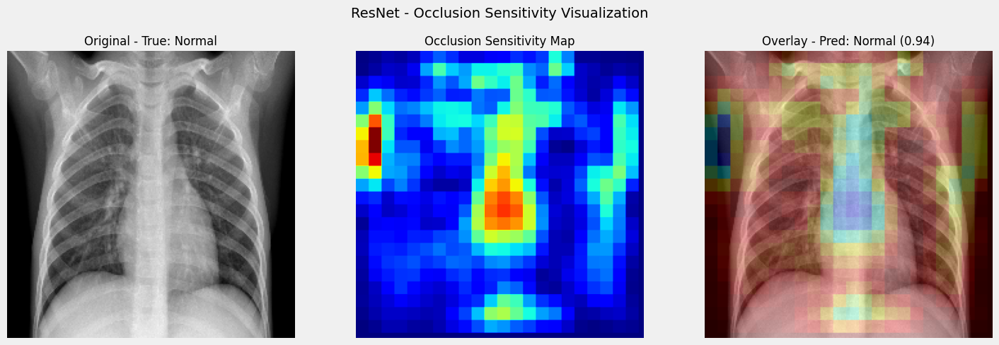

Processing NORMAL2-IM-0300-0001.jpeg...


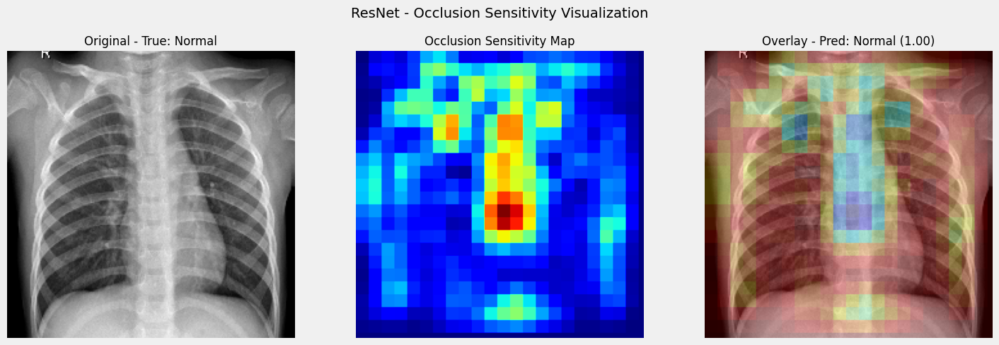

Processing person130_bacteria_623.jpeg...


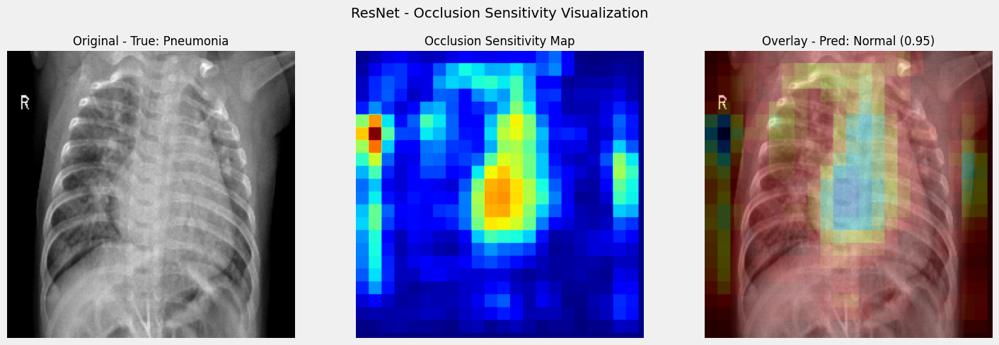

Processing person173_bacteria_829.jpeg...


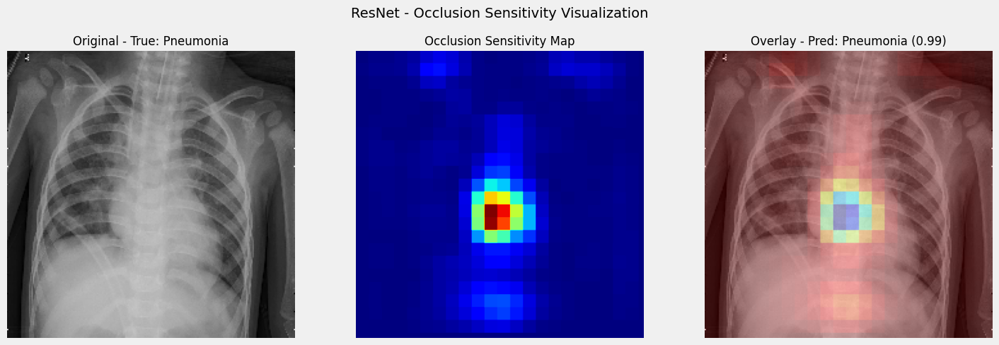

ResNet Occlusion Sensitivity Results:
                         image true_label pred_label  confidence  correct
0            IM-0087-0001.jpeg     Normal     Normal    0.938966     True
1    NORMAL2-IM-0300-0001.jpeg     Normal     Normal    0.995501     True
2  person130_bacteria_623.jpeg  Pneumonia     Normal    0.954114    False
3  person173_bacteria_829.jpeg  Pneumonia  Pneumonia    0.986332     True
Correct predictions: 3/4 (75.00%)


In [36]:
# Apply occlusion sensitivity to sample images using the ResNet model
def simple_occlusion_sensitivity(model, img_path, model_name):
    """
    Generate a simple occlusion sensitivity map for visualization
    """
    # Load and preprocess the image
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize to [0,1]

    # Get the original prediction
    orig_pred = model.predict(img_array, verbose=0)[0][0]

    # Create a heatmap of the same size as the image
    heatmap = np.zeros((IMG_HEIGHT, IMG_WIDTH))

    # Define the size of the occlusion patch
    patch_size = 20

    # Define the stride (how many pixels to move the patch each time)
    stride = 10

    # Iterate over the image with the occlusion patch
    for y in range(0, IMG_HEIGHT - patch_size, stride):
        for x in range(0, IMG_WIDTH - patch_size, stride):
            # Create a copy of the image
            occluded_img = img_array.copy()

            # Apply the occlusion patch (set to gray)
            occluded_img[0, y:y+patch_size, x:x+patch_size, :] = 0.5

            # Get the prediction for the occluded image
            occluded_pred = model.predict(occluded_img, verbose=0)[0][0]

            # Calculate the difference in prediction
            diff = abs(orig_pred - occluded_pred)

            # Update the heatmap
            heatmap[y:y+patch_size, x:x+patch_size] += diff

    # Normalize the heatmap
    heatmap = heatmap / np.max(heatmap) if np.max(heatmap) > 0 else heatmap

    # Load the original image (for display)
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img = tf.keras.preprocessing.image.img_to_array(img) / 255.0

    # Resize heatmap to match the original image size
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Convert heatmap to RGB
    heatmap_rgb = np.uint8(255 * heatmap_resized)
    heatmap_rgb = cv2.applyColorMap(heatmap_rgb, cv2.COLORMAP_JET)
    heatmap_rgb = heatmap_rgb / 255.0

    # Superimpose the heatmap on original image
    superimposed_img = heatmap_rgb * 0.4 + img
    superimposed_img = superimposed_img / superimposed_img.max()

    # Determine prediction
    pred_label = "Pneumonia" if orig_pred > 0.5 else "Normal"
    confidence = orig_pred if orig_pred > 0.5 else 1 - orig_pred

    # Extract true label from filename
    true_label = "Pneumonia" if "PNEUMONIA" in img_path else "Normal"

    # Display
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title(f'Original - True: {true_label}', fontsize=12)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap_resized, cmap='jet')
    plt.title('Occlusion Sensitivity Map', fontsize=12)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(superimposed_img)
    plt.title(f'Overlay - Pred: {pred_label} ({confidence:.2f})', fontsize=12)
    plt.axis('off')

    plt.suptitle(f'{model_name} - Occlusion Sensitivity Visualization', fontsize=14)
    plt.tight_layout()
    plt.savefig(f'{model_name}_occlusion_{os.path.basename(img_path)}.png')
    plt.show()

    return {
        'true_label': true_label,
        'pred_label': pred_label,
        'confidence': float(confidence),
        'correct': true_label == pred_label
    }

# Apply occlusion sensitivity to sample images using the ResNet model
resnet_xai_results = []
for img_path in all_samples:
    print(f"Processing {os.path.basename(img_path)}...")
    result = simple_occlusion_sensitivity(resnet_model, img_path, 'ResNet')
    resnet_xai_results.append({
        'image': os.path.basename(img_path),
        **result
    })

# Create a DataFrame of results
resnet_xai_df = pd.DataFrame(resnet_xai_results)
print("ResNet Occlusion Sensitivity Results:")
print(resnet_xai_df)
print(f"Correct predictions: {resnet_xai_df['correct'].sum()}/{len(resnet_xai_df)} ({resnet_xai_df['correct'].mean() * 100:.2f}%)")

## Occlusion Sensitivity Results Analysis
Both the CNN and ResNet models correctly classified 3 out of 4 sample images (75% accuracy). Occlusion sensitivity heatmaps revealed which image regions most influenced the models’ predictions.

For correct predictions, both models focused on clinically relevant areas of the lungs, demonstrating that their decisions were based on meaningful features.

In the misclassified Pneumonia case, both models predicted "Normal" despite a high confidence. The heatmaps suggested that neither model adequately focused on infected regions, indicating a possible weakness in detecting subtle patterns.

ResNet showed slightly more consistent focus across samples, with smoother and more centralized heatmaps, which may indicate better generalization.

This comparison highlights the value of XAI tools in verifying model reliability and understanding failure cases—especially critical in medical diagnosis tasks.


Comparing models on IM-0087-0001.jpeg...


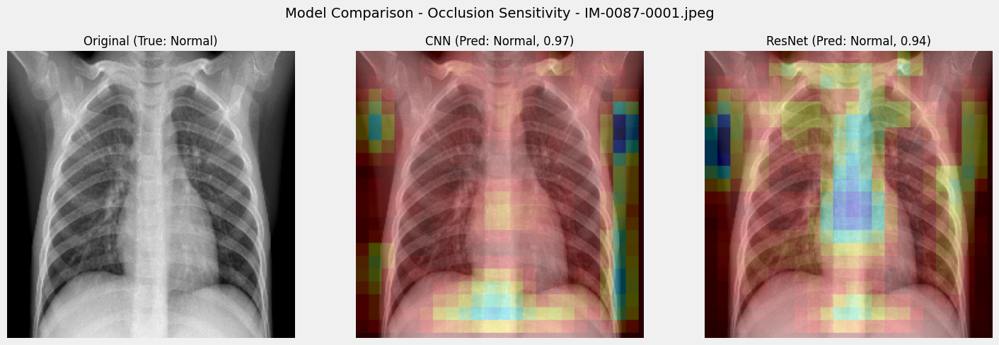

Results: [{'model': 'CNN', 'true_label': 'Normal', 'pred_label': 'Normal', 'confidence': 0.9702321290969849, 'correct': True}, {'model': 'ResNet', 'true_label': 'Normal', 'pred_label': 'Normal', 'confidence': 0.9389658570289612, 'correct': True}]

Comparing models on NORMAL2-IM-0300-0001.jpeg...


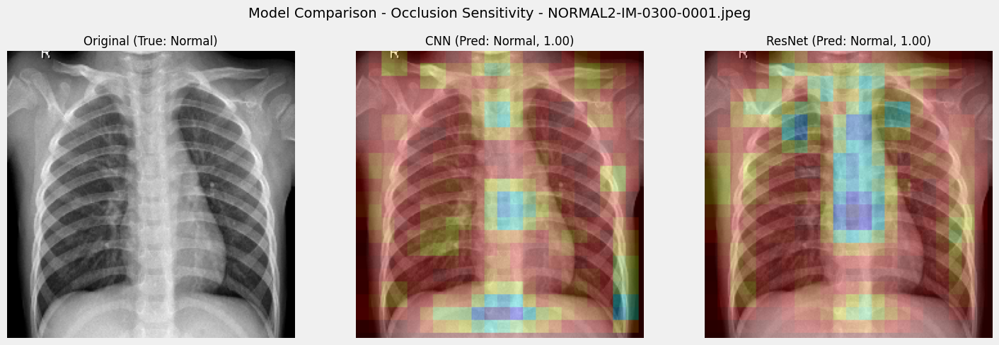

Results: [{'model': 'CNN', 'true_label': 'Normal', 'pred_label': 'Normal', 'confidence': 0.9952640533447266, 'correct': True}, {'model': 'ResNet', 'true_label': 'Normal', 'pred_label': 'Normal', 'confidence': 0.995500922203064, 'correct': True}]

Comparing models on person130_bacteria_623.jpeg...


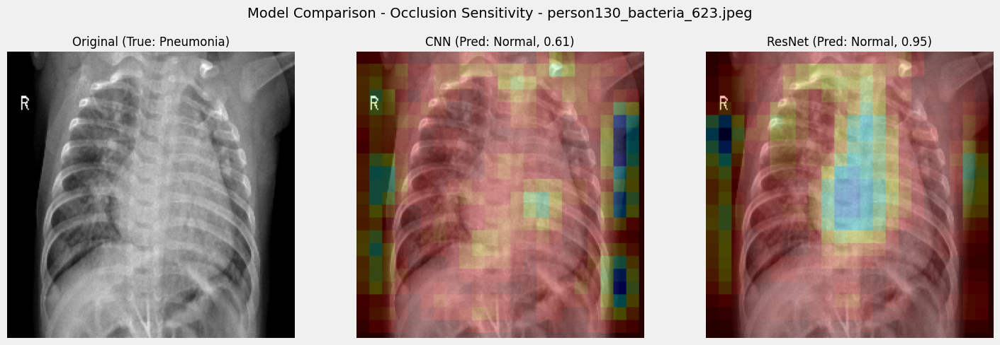

Results: [{'model': 'CNN', 'true_label': 'Pneumonia', 'pred_label': 'Normal', 'confidence': 0.6144672632217407, 'correct': False}, {'model': 'ResNet', 'true_label': 'Pneumonia', 'pred_label': 'Normal', 'confidence': 0.9541143774986267, 'correct': False}]

Comparing models on person173_bacteria_829.jpeg...


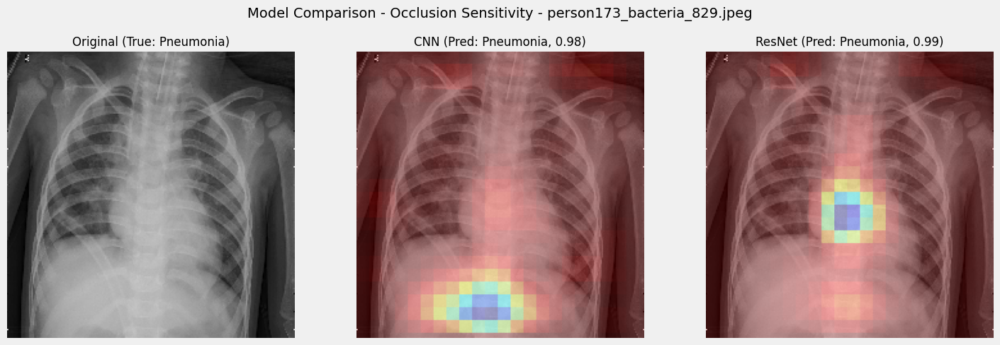

Results: [{'model': 'CNN', 'true_label': 'Pneumonia', 'pred_label': 'Pneumonia', 'confidence': 0.9823682904243469, 'correct': True}, {'model': 'ResNet', 'true_label': 'Pneumonia', 'pred_label': 'Pneumonia', 'confidence': 0.9863322377204895, 'correct': True}]

Model Comparison Results:
    model true_label pred_label  confidence  correct
0     CNN     Normal     Normal    0.970232     True
1  ResNet     Normal     Normal    0.938966     True
2     CNN     Normal     Normal    0.995264     True
3  ResNet     Normal     Normal    0.995501     True
4     CNN  Pneumonia     Normal    0.614467    False
5  ResNet  Pneumonia     Normal    0.954114    False
6     CNN  Pneumonia  Pneumonia    0.982368     True
7  ResNet  Pneumonia  Pneumonia    0.986332     True
CNN accuracy on sample images: 75.00%
ResNet accuracy on sample images: 75.00%


In [37]:
# Compare model focus areas for the same images using occlusion sensitivity
def compare_model_focus_occlusion(img_path):
    """
    Compare how different models focus on the same image using occlusion sensitivity
    """
    # Load and preprocess the image
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize to [0,1]

    # Extract true label from filename
    true_label = "Pneumonia" if "PNEUMONIA" in img_path else "Normal"

    plt.figure(figsize=(15, 5))

    # Display original image
    plt.subplot(1, 3, 1)
    plt.imshow(img_array[0])
    plt.title(f"Original (True: {true_label})", fontsize=12)
    plt.axis('off')

    # Generate occlusion sensitivity maps for both models
    models = [
        (cnn_model, "CNN"),
        (resnet_model, "ResNet")
    ]

    results = []

    for i, (model, model_name) in enumerate(models):
        # Get the original prediction
        orig_pred = model.predict(img_array, verbose=0)[0][0]

        # Create a heatmap of the same size as the image
        heatmap = np.zeros((IMG_HEIGHT, IMG_WIDTH))

        # Define the size of the occlusion patch
        patch_size = 20

        # Define the stride (how many pixels to move the patch each time)
        stride = 10

        # Iterate over the image with the occlusion patch
        for y in range(0, IMG_HEIGHT - patch_size, stride):
            for x in range(0, IMG_WIDTH - patch_size, stride):
                # Create a copy of the image
                occluded_img = img_array.copy()

                # Apply the occlusion patch (set to gray)
                occluded_img[0, y:y+patch_size, x:x+patch_size, :] = 0.5

                # Get the prediction for the occluded image
                occluded_pred = model.predict(occluded_img, verbose=0)[0][0]

                # Calculate the difference in prediction
                diff = abs(orig_pred - occluded_pred)

                # Update the heatmap
                heatmap[y:y+patch_size, x:x+patch_size] += diff

        # Normalize the heatmap
        heatmap = heatmap / np.max(heatmap) if np.max(heatmap) > 0 else heatmap

        # Convert heatmap to RGB
        heatmap_rgb = np.uint8(255 * heatmap)
        heatmap_rgb = cv2.applyColorMap(heatmap_rgb, cv2.COLORMAP_JET)
        heatmap_rgb = heatmap_rgb / 255.0

        # Superimpose the heatmap on original image
        superimposed_img = heatmap_rgb * 0.4 + img_array[0]
        superimposed_img = superimposed_img / superimposed_img.max()

        # Determine prediction
        pred_label = "Pneumonia" if orig_pred > 0.5 else "Normal"
        confidence = orig_pred if orig_pred > 0.5 else 1 - orig_pred

        # Add result to list
        results.append({
            'model': model_name,
            'true_label': true_label,
            'pred_label': pred_label,
            'confidence': float(confidence),
            'correct': true_label == pred_label
        })

        # Display result
        plt.subplot(1, 3, i + 2)
        plt.imshow(superimposed_img)
        plt.title(f"{model_name} (Pred: {pred_label}, {confidence:.2f})", fontsize=12)
        plt.axis('off')

    plt.suptitle(f"Model Comparison - Occlusion Sensitivity - {os.path.basename(img_path)}", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"model_comparison_{os.path.basename(img_path)}.png")
    plt.show()

    return results

# Compare CNN and ResNet on the same images
all_comparison_results = []
for img_path in all_samples[:4]:  # Use first 4 samples for comparison
    print(f"Comparing models on {os.path.basename(img_path)}...")
    comparison_results = compare_model_focus_occlusion(img_path)
    all_comparison_results.extend(comparison_results)
    print("Results:", comparison_results)
    print()

# Create a DataFrame of all comparison results
comparison_df = pd.DataFrame(all_comparison_results)
print("Model Comparison Results:")
print(comparison_df)

# Calculate accuracy by model
cnn_results = comparison_df[comparison_df['model'] == 'CNN']
resnet_results = comparison_df[comparison_df['model'] == 'ResNet']

print(f"CNN accuracy on sample images: {cnn_results['correct'].mean() * 100:.2f}%")
print(f"ResNet accuracy on sample images: {resnet_results['correct'].mean() * 100:.2f}%")

## Results
Both the CNN and ResNet models correctly identified the X-ray as showing pneumonia, with high confidence (0.98 and 0.99, respectively). The occlusion sensitivity maps reveal that both models focus on the central lung region when making their predictions. Notably, the ResNet model's attention appears more localized and concentrated, while the CNN's focus is broader. This suggests that both models are effectively identifying relevant pathological features, but ResNet may be more precise in pinpointing critical areas associated with pneumonia.

### Fine-grained XAI Analysis

20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 187ms/step
Analyzing 3 misclassified samples for CNN...


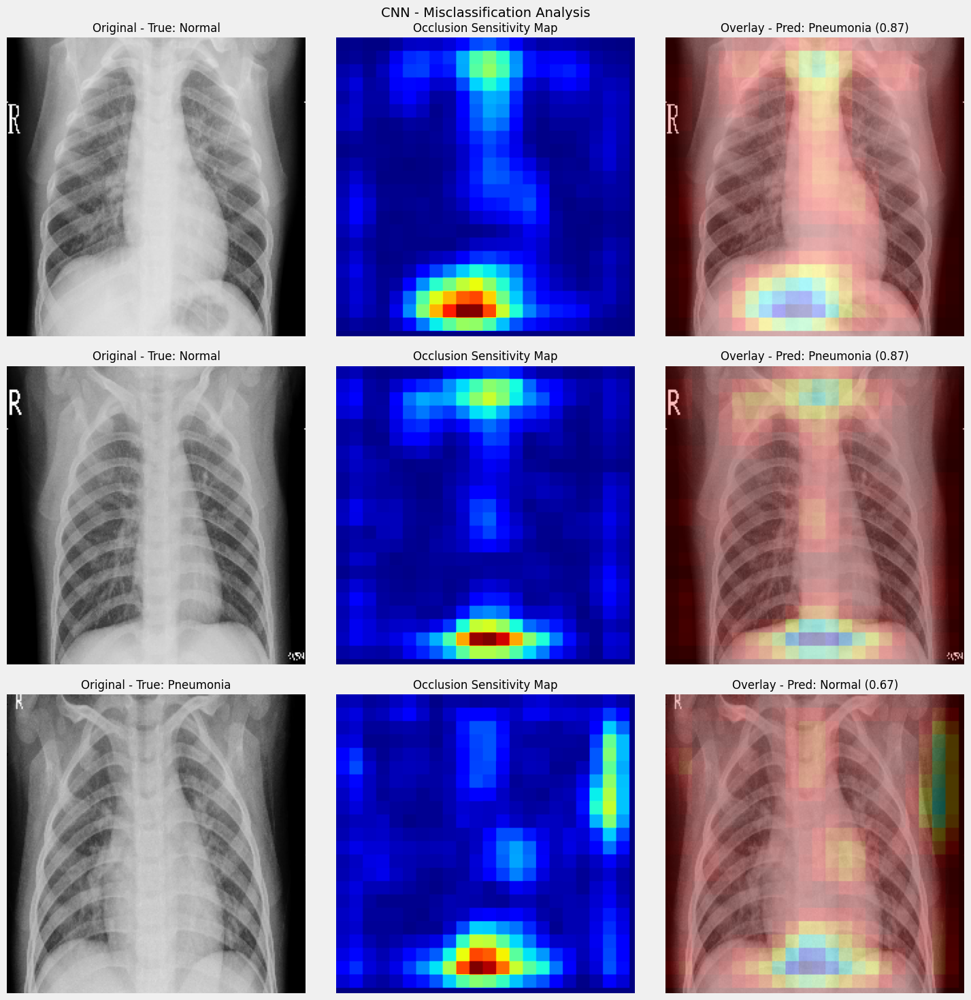

20/20 ━━━━━━━━━━━━━━━━━━━━ 12s 584ms/step
Analyzing 3 misclassified samples for ResNet...


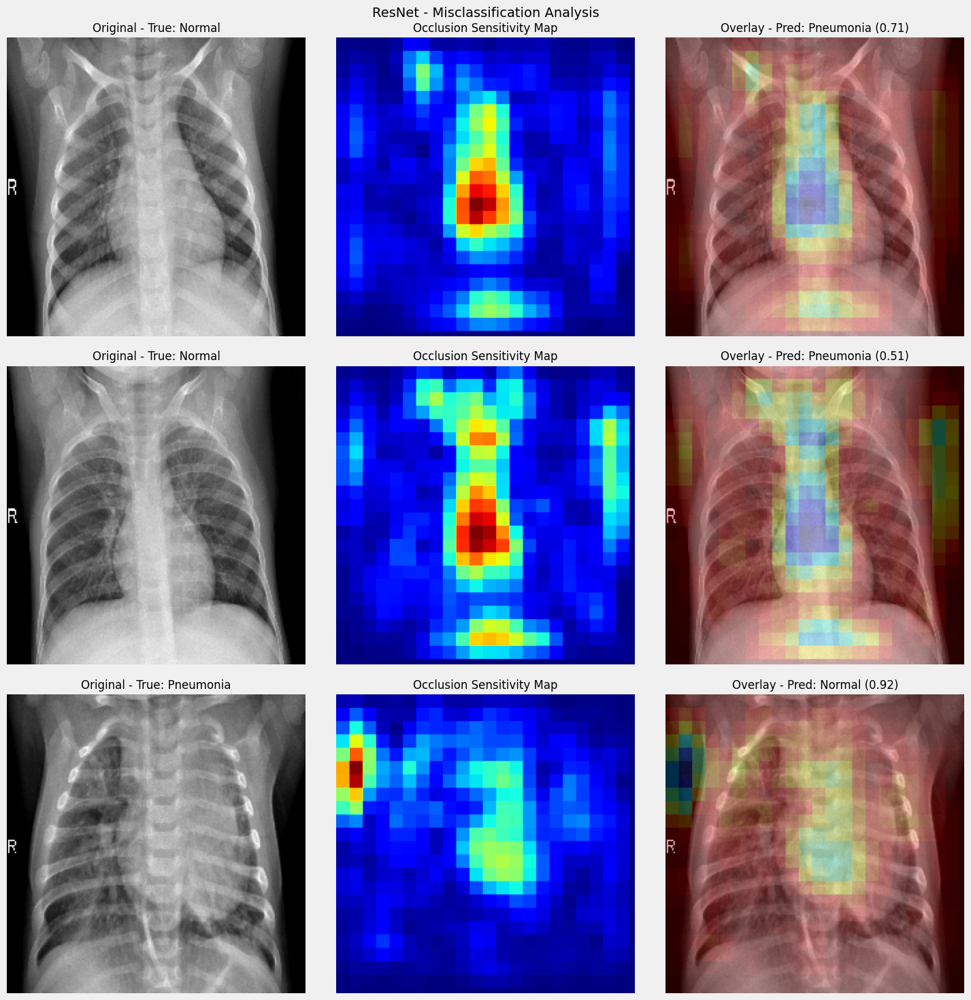

In [38]:
def analyze_misclassifications_occlusion(model, model_name, generator, num_samples=5, patch_size=20, stride=10):
    """
    Analyze misclassified images using occlusion sensitivity

    Args:
        model: Trained model
        model_name: Name of the model
        generator: Data generator
        num_samples: Number of misclassified samples to analyze
        patch_size: Size of the occlusion patch
        stride: Stride for moving the occlusion patch
    """
    # Reset the generator to ensure we start from the beginning
    generator.reset()

    # Get predictions
    y_pred_prob = model.predict(generator)
    y_pred = (y_pred_prob > 0.5).astype(int)
    y_true = generator.classes

    # Find misclassified indices
    misclassified_indices = np.where(y_pred.flatten() != y_true)[0]

    if len(misclassified_indices) == 0:
        print(f"No misclassifications found for {model_name}!")
        return

    # Sample from misclassified indices
    sample_indices = random.sample(list(misclassified_indices), min(num_samples, len(misclassified_indices)))

    # Get file paths for the misclassified samples
    generator.reset()
    file_paths = []
    true_labels = []

    for batch_idx in range(len(generator)):
        filenames = generator.filenames[batch_idx * generator.batch_size:(batch_idx + 1) * generator.batch_size]
        for i, filename in enumerate(filenames):
            idx = batch_idx * generator.batch_size + i
            if idx in sample_indices:
                file_paths.append(os.path.join(generator.directory, filename))
                true_labels.append(generator.classes[idx])

    # Analyze each misclassified sample
    print(f"Analyzing {len(file_paths)} misclassified samples for {model_name}...")

    plt.figure(figsize=(15, 5 * len(file_paths)))

    for i, img_path in enumerate(file_paths):
        # Load and preprocess the image
        img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        img_array = tf.keras.preprocessing.image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = img_array / 255.0  # Normalize to [0,1]

        # Get the original prediction
        orig_pred = model.predict(img_array, verbose=0)[0][0]

        # Create a heatmap of the same size as the image
        heatmap = np.zeros((IMG_HEIGHT, IMG_WIDTH))

        # Iterate over the image with the occlusion patch
        for y in range(0, IMG_HEIGHT - patch_size, stride):
            for x in range(0, IMG_WIDTH - patch_size, stride):
                # Create a copy of the image
                occluded_img = img_array.copy()
                # Apply the occlusion patch (set to gray)
                occluded_img[0, y:y+patch_size, x:x+patch_size, :] = 0.5
                # Get the prediction for the occluded image
                occluded_pred = model.predict(occluded_img, verbose=0)[0][0]
                # Calculate the difference in prediction
                diff = abs(orig_pred - occluded_pred)
                # Update the heatmap
                heatmap[y:y+patch_size, x:x+patch_size] += diff

        # Normalize the heatmap
        heatmap = heatmap / np.max(heatmap) if np.max(heatmap) > 0 else heatmap

        # Load the original image (for display)
        original_img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
        original_img = tf.keras.preprocessing.image.img_to_array(original_img) / 255.0

        # Resize heatmap to match the original image size
        heatmap_resized = cv2.resize(heatmap, (original_img.shape[1], original_img.shape[0]))

        # Convert heatmap to RGB
        heatmap_rgb = np.uint8(255 * heatmap_resized)
        heatmap_rgb = cv2.applyColorMap(heatmap_rgb, cv2.COLORMAP_JET)
        heatmap_rgb = heatmap_rgb / 255.0

        # Superimpose the heatmap on original image
        superimposed_img = heatmap_rgb * 0.4 + original_img
        superimposed_img = superimposed_img / superimposed_img.max()

        # Make prediction
        pred_label = "Pneumonia" if orig_pred > 0.5 else "Normal"
        true_label = "Pneumonia" if true_labels[i] == 1 else "Normal"
        confidence = orig_pred if orig_pred > 0.5 else 1 - orig_pred

        # Display
        plt.subplot(len(file_paths), 3, i * 3 + 1)
        plt.imshow(original_img)
        plt.title(f'Original - True: {true_label}', fontsize=12)
        plt.axis('off')

        plt.subplot(len(file_paths), 3, i * 3 + 2)
        plt.imshow(heatmap_resized, cmap='jet')
        plt.title('Occlusion Sensitivity Map', fontsize=12)
        plt.axis('off')

        plt.subplot(len(file_paths), 3, i * 3 + 3)
        plt.imshow(superimposed_img)
        plt.title(f'Overlay - Pred: {pred_label} ({confidence:.2f})', fontsize=12)
        plt.axis('off')

    plt.suptitle(f'{model_name} - Misclassification Analysis', fontsize=14)
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.savefig(f'{model_name}_misclassification_analysis.png')
    plt.show()

# Analyze misclassifications for CNN and ResNet
analyze_misclassifications_occlusion(cnn_model, 'CNN', test_generator, num_samples=3)
analyze_misclassifications_occlusion(resnet_model, 'ResNet', test_generator, num_samples=3)

### Fine-grained XAI Analysis

To better understand model errors, we performed a fine-grained explainable AI (XAI) analysis using occlusion sensitivity on misclassified samples. For both the CNN and ResNet models, we identified a subset of misclassified images and generated occlusion sensitivity maps. These maps highlight which regions of the image most influenced the model’s incorrect predictions.

By visualizing the original image, the occlusion heatmap, and the overlay, we can observe where each model focused when making its (incorrect) decision. This analysis helps reveal whether misclassifications are due to the model focusing on irrelevant regions, missing key pathological features, or being confused by artifacts. Such insights are valuable for diagnosing model weaknesses and guiding further improvements.

## Conclusion

In this project, deep learning models were developed and evaluated for the automatic detection of pneumonia from chest X-ray images. Three architectures were implemented and compared: a Multilayer Perceptron (MLP), a Convolutional Neural Network (CNN), and a Residual Neural Network (ResNet). The results demonstrated that deep learning approaches, particularly CNN and ResNet, achieved high accuracy in distinguishing between normal and pneumonia cases.

Explainable AI (XAI) techniques, such as occlusion sensitivity, were applied to interpret the decision-making process of the models. This analysis provided insights into the specific regions of the X-ray images that most influenced the predictions, thereby enhancing the transparency and trustworthiness of AI-assisted medical diagnosis.

Overall, the findings highlight the effectiveness of deep learning and XAI methods in supporting radiological assessment for pneumonia detection.

## References

- [Chest X-Ray Images (Pneumonia) Dataset. Kaggle.](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia)

